## Todo
Fra Troels:
Her er noget som ville være spændende at få sat op:

1) Lav et simpelt setup for en prestellar core. Brug en Bonnor-Ebert sphere (se evt comp astro uge 4 eller uge 5)

2) Antag at BE-sfæren er i ligevægt, og derfor ikke ændrer sige

3) Beregn hvordan støv vil udvikle sig, når det slippes løs i sådan i sfære, som funktion af støv størrelsen.

Brug gerne rigtige tal. Dvs. R_BE ≈  10,000 AU, M_BE ≈2 Msun, T = 10 K


Mig selv:

1) For inskrevet at man kan gøre det fysisk. Brug de critiske ligninger osv. du har fundet

2) Test om det passer med massen.

3) implementer partilker. udnyt at det minder om comp astro examen, (start med et spestemt støv regime)

4) implementer drag. 

5) test at ting ikke flyver af helvede til.

6) find på en måde at teste hvor gyldigt det er. (stopping time?)

7) Ryd op i kode.

bonus:
    implementer scaling pakken

## Excat solution to Bonnar-emden sphere through numerical analsys.
(Used Rober Estalella, The Bonnor-Ebert Sphere, provied in the computational astophyscis course)

If we assume that we have a homogenous gas, in all directions except the radial. This gas i also assumed to be in hydrostatic equlibrium.
\begin{equation}
    \frac{dP}{dr} = - \frac{G M_r}{r^2}\rho
\end{equation}
Here $M_r$ is the mass, which depends on our radius r and can be discrubed by the density.
\begin{equation}
    dM_r = 4\pi r^2 \rho dr \Leftrightarrow \frac{dM_r}{dr} = 4\pi r^2\rho
\end{equation}
We can now isolate M_r i our hydrostatic equlibrium equation and insert it into our mass equation.
\begin{equation}
    \frac{1}{r^2}\left(\frac{r^2}{\rho}\frac{dP}{dr}\right) + 4\pi G\rho = 0
\end{equation}
We can express the preasure in terms of the sound speed and the density by assuming a isothermal gas ie. $P = c_s^2 \rho$, where $c_s^2 = k_b T/(\mu m_h)$.
\begin{equation}
    \frac{1}{r^2}\left(\frac{r^2}{\rho}\frac{d\rho}{dr}\right) + \frac{4\pi G}{c_s^2}\rho = 0
\end{equation}
The boundry conditions for this system is 
\begin{align}
    \rho(0) &= \rho_c\\
    \frac{d\rho}{dr}|_{r=0} &= 0
\end{align}
This is because we want the center of the sphere to be physcially representitive with a finite center density, and we don't want it to in crease in negative r, as this is not physcial.

Before we solve the system it would be beneficial to rewrite it with to a dimmensionalless form. Here we need to define some charateristik parameters. In this equation we only have units of density and length, so a good choice of charateristik parameters would be $\rho_c$ which we define ourself, and $r_c$ which we need to find though dimmensional analasys. $r_c$ can be found though dimmensional analsys.
\begin{equation}
    r_c = \frac{c_s}{\sqrt{4\pi G \rho_c}}
\end{equation}
$4\pi$ is inclueded as it is dimmensionalless and it is beneficial to include it, specific for our equation, as it allows us to get a nice adimmensional equation.

We can now define adimmensional parameters x,y.
\begin{align}
    x = \frac{r}{r_c}\\
    y = \frac{\rho}{\rho_c}
\end{align}
By inserting these into our density equation we get a adimmensial equation of form.
\begin{equation}
    \frac{1}{x^2} \frac{d}{dx}\left(\frac{x^2}{y}\frac{dy}{dx}\right) + y = 0
\end{equation}
We can make this reseble the Lane–Emden equation by defining $u = \ln(y)$ and iserting it into our adimmensional equation. This is done as we get a every easy equation to solve numerically.
\begin{equation}
    \frac{1}{x^2}\frac{d}{dx}\left(x^2 \frac{du}{dx}\right) + e^u = 0
\end{equation}
This ODE can be writte as a set of coulpled ODEs, that makes it a lot easier to solve, by defining $z = x^2 d_xu$
\begin{equation}
    \frac{du}{dx} = \frac{z}{x^2}
\end{equation}
\begin{equation}
    \frac{dz}{dx} = - x^2 e^u
\end{equation}
Now we just need to define the boundries in these new units.
\begin{align}
    u(0) &= \ln(y(0)) = \ln\left(\frac{\rho_c}{\rho_c}\right) = 0\\
    z(0) &= 0^2\frac{du}{dx}|_0 = 0
\end{align}
Now we can solve this system numerially with a forward method like runge-kutta.

## The Mass
The adimensional bonnar-emden for our boundry conditions, is somewhat independent (we need to solve further or equal to our bonnar sphere) from our physcial representation. So to be able to set up a system of a BE-sphere of a given a mass and radius we need to couple some of our charateristic parameters with the mass $M_r$.

If we start with our radial mass equation
\begin{equation}
    dM_r = 4\pi r^2 \rho dr
\end{equation}
If make this adimensional and then integrate both sides from the centor the the edge then we might be able to get an idea of the central density as the mass should be total at $R_{max}$.
\begin{align}
    dM_r &= 4\pi r_c^3 \rho_c \; x^2 y dx\\
    M_r  &=  4\pi r_c^3 \rho_c \int_0^x x'^{\;2} y dx'
\end{align}
This integral equation can be estimated numerically by writing it as a sum, if we assume that we have a small mesh spacing. One could also use the trapzoidal rule, but as we define our own mesh we just use the sum discretization.
\begin{equation}
    M_r = 4\pi r_c^3 \rho_c \sum_{i=0}^n x_i^2y_i \Delta x_i = 4\pi r_c^3 \rho_c m_c
\end{equation}
where $x_n = x$ ie. the upper bound of our integral. $m_c$ is a adimensional mass, that is depended on the adimensional laden-emden equation.

Important note: $r_c$ depends on $\rho_c$
So write
\begin{equation}
M_r = 4 \pi \left(\frac{c_s}{\sqrt{4\pi G \rho_c}}\right)^3 \rho_c m_c \Leftrightarrow
\end{equation}

## Critical stability values
To have a stable cloud we need
\begin{equation}
    \frac{\partial P_0}{\partial r_0} = c_s^2 \frac{\partial \rho_0}{\partial r_0} < 0
\end{equation}
For if this was > 0 for the outer region then the gas would diffuse out. So we can try and find the criticla mass value for a given chouse of $\rho(r)$ in this case $\rho_0$. remember $y = \rho/\rho_c$
\begin{equation}
 M_r(r) = \frac{c_s^3}{\sqrt{4\pi \rho_c} G^{3/2} } m_c(x) = \frac{c_s^3\sqrt{y}}{\sqrt{4\pi \rho(r)} G^{3/2} } m_c(x) = \frac{c_s^3}{\sqrt{4\pi \rho} G^{3/2} } m'_c(x)
\end{equation}
We can now use $m'_c$ to find where the critical point for a cloud is, by discretizing it the same way as $m_c$. Here we need to find the first maxima, as this is this will give us the minimum radius that the cloud is allowed for it to be stable, this we can do in both the adimmensional space of x and y. When these are found we can find the mass and radius at these points simply by converting our critical adimmensional parameters.
\begin{align}
    r(r_o)= R_{BE} &= x_{crit} r_c = x_{crit} \frac{c_s}{\sqrt{4\pi G \rho_c}}\\
    M(r_o) = M_{BE} &= m_{crit} \frac{c_s^3}{\sqrt{4\pi \rho_o} G^{3/2} } = m_{crit} \frac{c_s^3}{\sqrt{4\pi y_{crit} \rho_c} G^{3/2} }
\end{align} 
A relation between $M_{BE}, R_{BE} and T$ can be found by writing $M_{BE}$ in terms of $c_s$ and $R_{BE}$
\begin{equation}
    M_{BE} = \frac{m_{crit}}{\sqrt{y_{crit}}x_{crit}} \frac{c_s^2}{G} R_{BE} = A_{crit}\frac{c_s^2}{G} R_{BE}
\end{equation}
This we can write in practical units and we can let $\mu$ and $A_{crit}$ be a tunable parameter as it is unitless. $A_{crit}$ is a constant, but i will load it in from a file for sanity, plus i will allow recalulation of solving the adimmensional density, again as a sanity check.
\begin{equation} 
    \left[\frac{M_{BE}\;R_{BE}^{-1}}{M_\odot \; AU^{-1}}\right] = 9.303038506e\text{-}6\frac{A_{crit}}{\mu}\left[\frac{T}{K}\right] \; \text{where} \; A_{crit} \approx 2.43
\end{equation}
We can now define our charatistic values like the charatistic length $r_c$ and the center denisty $\rho_c$ from a given combination of 2 of mass, radius and temperture.
\begin{equation}
M_{BE} = \frac{m_{crit}}{\sqrt{y_{crit}}} \frac{c_s^3}{\sqrt{4\pi \rho_c} G^{3/2} } \Leftrightarrow  \rho_c= \frac{m_{crit}^2}{y_{crit}} \frac{c_s^6}{4\pi M_{BE}^2 G^{3} }
\end{equation}

## Particle gas drag
To find the drag of a particle we need to look at aerodynamic drag forces (Philip J. Armitage lecture notes).

\begin{equation}
    F_D = -\frac{1}{2}C_d\pi s^2\rho_g v_{dg}^2
\end{equation}
for the Epstein regine we have that
\begin{equation}
    C_D = \frac{8}{3}\frac{\bar{v}}{v_{dg}} \mspace{10mu} \text{for} \mspace{10mu} s < \frac{9}{4}\lambda_f
\end{equation}
Here $\lambda_f$ is the mean free path, and $\bar{v} = \sqrt{8/\pi}\mspace{5mu}c_s$ (<- bar v).
This gives us a drag force of 
\begin{equation}
    F_D = -\frac{V_d}{s}\rho_g \bar{v} v_{dg}
\end{equation}
Here $V_d$ is the volume of a given dust grain.
Here we can simply write the acceleration from the drag and such form newtons second law.
\begin{equation}
    m_d a = F_{total} = F_d+\sum_i F_i \Leftrightarrow a = \frac{F_d}{m_d} + \frac{1}{m_d}\sum_i F_i = -\frac{V_d}{m_d}\frac{\bar{v}}{s}\rho_g v_{dg}+\frac{1}{m_d}\sum_i F_i
\end{equation}
So here we get
\begin{equation}
a = -\frac{\rho_g}{\rho_d}\frac{\bar{v}}{s}v_{dg}+\frac{1}{m_d}\sum_i F_i
\end{equation}
So if we assume that the only other force is gravity then we get
\begin{equation}
\frac{dv_d}{d t} = -\frac{\rho_g}{\rho_d}\frac{\bar{v}}{s}v_{dg} + g = -C_d (v_d - v_g) + g
\end{equation}
Going with an implciit scheme.
\begin{equation}
\frac{v_d^{n+1}- v_d^n}{dt} = -C_d (v_d^{n+1} - v_g) + g
\end{equation}
we now define $\Delta v_d = v_d^{n+1}- v_d^n$
\begin{equation}
\frac{\Delta v_d }{\Delta t} = -C_d (\Delta v_d + v_d^n - v_g) + g
\end{equation}
Solveing for $\Delta v_d $
\begin{equation}
\Delta v_d = \frac{\Delta t g - \Delta t C_D (v_d - v_g)}{1 + \Delta t C_D}
\end{equation}

So the next velcoty step becomes $\Delta v_d = v_d^{n+1}- v_d^n$.
\begin{equation}
v_d^{n+1} = v_d^n +  \frac{\Delta t g - \Delta t C_D (v_d - v_g)}{1 + \Delta t C_D} = v_d^n + \frac{\Delta t \{g - C_D (v_d - v_g)\}}{1 + \Delta t C_D}
\end{equation}

## Stokes number
The stopping time for this drag can easily be found through dimmensional analysis. Here we take the momentum change of the drag-dust velocity and the drag force.
\begin{equation}
    t_{stop} = \frac{|p_{dg}|}{|F_D|} = \frac{m_d v_{dg}}{\frac{V_d}{s}\rho \bar{v} v_{dg}} = \frac{\rho_d}{\rho_g}\frac{s}{\bar{v}}
\end{equation}

This is concequently the inverse of the method \lstinline{drag} for \lstinline{class Particles}.

From the stopping time and free-fall time
\begin{equation}
    t_{ff} = \sqrt{\frac{3\pi}{32G\rho_g}}
\end{equation}

The stokes number is defined as 
\begin{equation}
    S_t = \frac{t_{stop}}{t_{ff}} = \frac{\rho_d s}{\rho_g(r) \bar{v}}\sqrt{\frac{32 G \rho_g}{3\pi}}
\end{equation}
So as $c_s$ is constant due to the sphere being isothermal, we have that the only r dependcy of $S_t$ is $\rho_g$.
\begin{equation}
    S_t \propto \frac{1}{\rho_g(r)}
\end{equation}
This means that in the inner parts of the sphere, our stokes number only depends on the grain size.
To convert from stokes number to given size at a given radius we use.
\begin{equation}
    s = \frac{t_{ff} \rho_g \bar{v}}{\rho_d} St
\end{equation}

## Sphere based on snapshots.

To use af snapshot approach to the spheres evolution one has to take into account a few things. The first is the integration method.
Here each snapshot has a given time given to them named  $t_n = [ t_0, t_1, t_2, ..., t_N]$ where $N$ is the number of snapshots. So we need to integrate our particles up till we hit the snapshot time, ie. start at $t_0$ then evolve particles, until the evolved time $t_evo == t_1$ and so forth.
To control the step size one just choses the minimum between the particales courant conditions or the remaining time ie.
\begin{equation}
    \Delta t = \text{min}(\Delta t_{courant}, t_n - t_{evo})
\end{equation}

This is repeated until all partiles are at $t_n$.

ASCI illustration
\begin{enumerate}
\item  •------>        | next iteration   •------>----->  | iterate until all  •------>----->->| Change to new snapshot\\
\item  •-------------->|  same snapshot   •---------------| is at the next     •---------------| and repeat procces\\
\item  •---------->    | ------------>    •---------->--->| shot.              •---------->--->| until no snapshots\\
\item •- >            |                  •->--->         |                    •->--->--->---->|   \\
\end{enumerate}

## Grain distibution into radial bins
NOTE We essentaully have a grain desitrubtion of dn/da = N*a^-3.5 in each radiual bin


## Change in snapshot velocity
As we are essentially jumping from snaphot to snapshot, we need to approximate the velocity of the gas in a better way then just, such that we get a better approximation for our particles to follow/reach the new edge of the sphere. This also allows the partilces to say distributed correct for small St, ie stuff that is coulple to the gas.

## Fixing The cells counting the wrong number of particles, ie correct the spheres radials cells movement over time, so there is a correspondace.

A problem with the above mentionend interpolation scheme is that we do not acount for the moving cells, and how they potentialle squish over time. This is a problem as we do not run the collapse simulation in the same simulation as our particales but rather because we use snapshots of the collapse for the simulation. 

To begin fixing this problem we first look at  a time depended interpolation scheme

So to start we consider a grid in time where we have 2 cell center positions of our particle envourment, ie a sphere. Here we only look at a single cell.

\begin{enumerate}
    \item ----a---p------b--------
    \item ----a----------b--------
    \item --------a-----------b---
\end{enumerate}
Here a and b are each a cell center from which we interpolate our data. p is a particle that has a radius at a given time step t. We here then wish to interpolate physcial properties like velotity or radius from cell a and b to the location of p. If our cells a and b where static in space, ie their radius doesn't change, then we didn't need to update anything, but as and and b are moving we need to correct the spacial coordinate of p such we take into account a moving coordinate system.

To start we simply define how the radius of a cell center would have moved over time due to a velocity $v_g$
\begin{equation}
    r_c(cell,dt) = r_c(cell) + dt\; v_g(cell)
\end{equation}
dt here is the difference in time between the start of the snapshot and the time of the particle

We can now begin to look at how our interploation between a & b changes with time. First we look at our linear interploation scheme.
\begin{equation}
    f = \frac{p - a}{b - a}
\end{equation}
Which is similar to a lagragne polynomial between two points, with out the y data.
If we know insert our radius of p at dt time, with our formula of $r_c(cell,dt)$ we then get.
\begin{equation}
    f = \frac{r_p - r_c(a) - dt\;v_g(a)}{r_c(b) + dt\;v_g(b)) -r_c(a) - dt\;v_g(a))} = \frac{r_p - r_c(a) - dt\;v_g(a)}{dr(b,a) + dt\;dv_g(b,a)}
\end{equation}
Where
\begin{align}
    dr(b,a) &= r(b) - r(a)\\
    dv_g(b,a) &= v_g(b) - v_g(a)
\end{align}
If we define $f_0$ as our original f value, ie at dt = 0, we then get
\begin{equation}
    f_0 = \frac{r_{p,0} - r_c(a)}{dr(b,a)}
\end{equation}
We know set $f_0 = f$ So we can find r_{p,0}, as it represents the reference radius for the sphere, ie in its reference frame.

\begin{equation}
     \frac{r_{p,0} - r_c(a)}{dr(b,a)} = \frac{r_p - r_c(a) - dt\;v_g(a)}{dr(b,a) + dt\;dv_g(b,a)}
\end{equation}


Now we simply solve for $r_{p,0}$.
\begin{equation}
r_{p,0} = r_c(a) + \frac{r_p - r_c(a) - dt\;v_g(a)}{dr(b,a) + dt\;dv_g(b,a)}*dr = r_c(a) + \frac{r_p - r_c(a) - dt\;v_g(a)}{1 + \alpha} 
\end{equation}
\begin{equation}
r_{p,0} = (1-\beta)r_c(a) + \beta \;r_p - \beta\;dt\;v_g(a)
\end{equation}
where 
\begin{align}
 \alpha &= \frac{dt\;dv_g(b,a)}{dr} \\
 \beta &= \frac{1}{1 + \alpha} = \frac{dr(b,a)}{dr(b,a) + dt\;dv_g(b,a)}
\end{align}
Here if $\beta = 1$ then we get a very simple scheme that simply represents the change of coordiantes from the particles to the spheres reference frame. This however requires either $dv_g  = 0 $ or $dt = 0$, as $dt=0$ would mean no simulation the only possilbe out come for $\beta = 1$ is $dv_g  = 0 $ which means that the velocity in the two cells are the same.

This can also be done from f = (b-p)/(b-a), so from the perspective of b instead of a.
The procces is exactly the same
\begin{align}
    f0 &= \frac{r_b-r_0}{r_b-r_a} = \frac{r_b - r_0}{Dr(b,a)}\\
    f  &= \frac{r_b + v_{b}\;DT - r_p}{Dr(b,a) + DT\;Dv(b,a)}\\
    f0 &= f \Leftrightarrow r_b - r_0 = \frac{Dr(b,a)}{Dr(b,a) - DT\;Dv(b,a)}\left(r_b + v_{b}\;DT - r_p\right)
\end{align}
Solve for $r_0$
\begin{align}
    r0 &= r_b - \frac{Dr(b,a)}{Dr(b,a) - DT\;Dv(b,a)}\left(r_b + v_{b}\;DT - r_p\right)\\
    r0 &= \beta r_p + (1-\beta)r_b - \beta v_{b}\;DT
\end{align}

This here resault in exaclty the same $\beta$ and $\alpha$ values and same scheme execpt we have $v_b$ and $r_b$ instead of $v_a$ and $r_a$. This scheme may be more suited for our case as we should only expect the dust particles to move inwards

From calulating the two factors we see that $\beta \approx 1$ until near 50 where we have consistent peaks near 5

## Optimizations

It seems that the interpolation and magnitude calulations are the biggest bottle necks.
So to fix this one needs to either refractor most magnitude calulatiosn to just use $r^T r$ instread of $|r|$.
Not much can be done with the interpolation though

##
Ways to improve, the code (Dont do it yet as it is this is essentially not part of the thesis).
One could do a diffrent time step, should that we dont go from snap 0 -> 1 as in one big dt = t_1 - t_0
but instead we step in a mid way kinda ordeal, like leap frog
\begin{enumerate}
1 |--------|---------|
2 |-->|---------|---------|
  0      1         2
\end{enumerate}

What essentially gives us a more correct estimation for how the cloud conditions are, as we are useing snap 1s could conditions closer to it origin time.
You can think about this as our approximation of how the cloud looks at a time t that is close to t_1, is closer to the actuall condtions of snapshot 1 then it is of snapshop 0.
This method is also a midpoint rule of the time basicly.




In [1]:
#%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
import scipy.integrate as scint
import scipy.optimize as sciopt
import scipy.interpolate as scilate
import seaborn as sns
sns.set(context = 'notebook',font = 'serif',font_scale = 1.3)
sns.set_palette('Set2', 8)


import scaling as sc
import os

try:
    os.stat( './Plots')
except: 
    os.mkdir('./Plots')
    os.mkdir('./Plots/drag')


# TODO make these into rc params.
labeloptions = {
    'fontsize' : 14     ,
    'fontname' : 'serif',
}
plotoptions = {
    'linewidth' : 2
}

legendsoptions = {
    #'loc'      : 2      ,
    'frameon'  : False  ,

    'prop'     : {'family': 'serif',
                  'size'  : 12},
}

In [2]:
def magnitude(r, keepdims = False):
    """ 
    scalar magnitude of a vector
    from num astro
    """
    return np.sqrt(np.sum(r**2,1,keepdims=keepdims))

In [3]:
class BE_sphere(object):
    # xmin, xmax are temp? maybe NOTE
    __slots__ = 'units','rho_c','rc','xcrit','y', 'xmin','xmax','mu','rho','T','M','rmin', 'R','vg'
               #sc.cgs , float, float, float, callable, float, float
    def __init__(sphere,units, M_BE = 1.0, T = lambda x: 10,drag=0.001, vg = lambda x: 0):
        Acrit,xcrit,ycrit,mcrit = np.loadtxt('./emden-solve/crit-value.txt',unpack = True) 
        xi,yi,_                 = np.loadtxt('./emden-solve/rho-adim.txt'  ,unpack = True)
        dx = xi[1]-xi[0]

        M_BE  = M_BE * units.m_Sun
        cs_sq = units.k_B*T/(units.mu*units.m_p) # base units
        rho_c = mcrit**2 * cs_sq**3/(4*np.pi*ycrit * M_BE**2 * units.G**3)
        r_c   = np.sqrt(cs_sq/(4*np.pi * units.G * rho_c))
        if callable(T): sphere.T = T
        else:           sphere.T = lambda x : T
        
        sphere.units = units
        sphere.rc    = r_c
        sphere.rho_c = rho_c
        sphere.mu    = units.mu


        sphere.xcrit = xcrit
        sphere.xmin  = xi[0]    ; sphere.xmax = xi[-1]
        sphere.rmin  = xi[0]*r_c; sphere.R    = xcrit*r_c

        m = 4*np.pi*np.cumsum(xi*xi * yi)*dx*rho_c * r_c**3
        sphere.M     = scilate.interp1d(xi*r_c,m)
        sphere.y     = scilate.interp1d(xi,yi,'linear')
        sphere.rho   = scilate.interp1d(xi*r_c,yi*rho_c,'linear')

        r  = np.linspace(sphere.rmin, sphere.R,len(xi))
        m  = sphere.M(r) ; rho = sphere.rho(r)
        ## To ensure that that are no out of bounds errors, this menas that M is constant out of R, rho is 0 as the sphere is stable and is equal to R
        sphere.M   = scilate.interp1d(r, m, 'linear',  fill_value = (m[0],m[-1]), bounds_error = False)
        sphere.rho = scilate.interp1d(r, rho,'linear', fill_value = (rho[0], 0), bounds_error = False) # unsure here if it should be zero
        sphere.vg  = vg
        if callable(vg): sphere.vg = vg
        else:            sphere.vg = lambda x : vg
        #fill_value = (m[0],m[-1]), bounds_error = False
        #fill_value = (yi[0],yi[-1]), bounds_error = False
        #fill_value= (yi[0]*rho_c,yi[-1]*rho_c), bounds_error = False

    def drag(self, r, s,rho_d = 1.6,):
        """
        This is actually the inverse stopping time.
        so drag = 1/t_s


        rho_d = 1.6 g/cm^3
        """
        rm    = magnitude(r,True)
        rho_g = self.rho(rm)
        vth   = np.sqrt(8/np.pi * self.units.k_B*self.T(rm)/(self.mu*self.units.m_p))
        return rho_g*vth/(rho_d*s)
        #vth =  self.units.k_B*self.T/(self.units.mu*self.units.m_p)

    # def drag_coeff(self,r,particle_size):
        # rm = magnitude(r)
        # return self.drag*self.density(rm)/particle_size
    

In [4]:
def numerical_generation(xstart = 1e-6, xend = 8, n = 64, write_file = False):
    """
    Calulates the critical values and the adimmenional radius and density.
    """
    def lane_emden(y, xi):
        """
        This is not the adimensional vairable from the text!
        y = [u, z]
        dydt = [dudx,dzdx]
        """
        u, z = y
        dydx = [z/(xi*xi), -xi*xi*np.exp(u)]
        return dydx
    xi, dx = np.linspace(xstart, xend, n, retstep= True)
    y_init = [0, 0]
    res    = scint.odeint(lane_emden, [0, 0], xi)
    yi     = np.exp(res[:,0])
    m      = np.cumsum(xi*xi*yi*dx)
    # critical values regeneration #
    mc      = np.sqrt(yi)*m
    dmdx    = np.gradient(mc,xi)
    dmdy    = np.gradient(mc,yi)
    mc_f    = scilate.interp1d(xi,mc,'linear')
    dmdx_f  = scilate.interp1d(xi,dmdx,'linear')
    dmdy_f  = scilate.interp1d(yi,dmdy,'linear')
    xcrit   = sciopt.fsolve(dmdx_f,6)
    ycrit   = sciopt.fsolve(dmdy_f,1/14.1)#1/1.41 seems to give an error?
    mcrit   = mc_f(xcrit)
    Acrit   = mcrit/(np.sqrt(ycrit)*xcrit)
    crit    = np.hstack([Acrit, xcrit, ycrit, mcrit])
    if (write_file == True):
        try:
            os.mkdir('./emden-solve')
        except FileExistsError:
            pass
        np.savetxt('./emden-solve/crit-value.txt', crit)
        np.savetxt('./emden-solve/rho-adim.txt'  , np.c_[xi,yi,m])
    else:
        return crit,np.c_[xi,yi,m].T

In [5]:
class Particles(object):
    __slots__ = 'n','t', 'dt' , 'env','units','r','s', 'Stmin' , 'Stmax', 'rho_d', 'v','M' ,'D', 'ngrains','sinterface'
    def __init__(self, n, env, R, Stmin, Stmax,rho_d = 1.6, C = 0.004):
        self.n      = n
        self.t      = np.zeros((n     ,1),dtype = np.float64)
        self.dt     = np.zeros((self.n,1),dtype = np.float64)
        self.env    = env ## enviorment ie sphere.
        self.units  = env.units
        self.r      = np.zeros((n,2),dtype = np.float64)
        self.v      = self.r.copy()
        self.r[:,0] = R
        self.rho_d  = rho_d # g/cm ^3
        st     = np.geomspace((Stmin,), (Stmax,), n)
        rmag   = magnitude(self.r, True)
        tff    = np.sqrt(3*np.pi/(32*self.units.G*self.env.rho(rmag)))                           # TODO move to enviorment
        vth    = np.sqrt(8/np.pi * self.units.k_B*self.env.T(rmag)/(self.env.mu*self.units.m_p)) # TODO move to enviorment instead, and then just call it.
        self.s = tff * self.env.rho(rmag)* vth / self.rho_d * st

    @property
    def search(self):
        rm = magnitude(self.r)
        return np.int64(self.env.interpolatesearch[self.env.idstep](rm))


    @property
    def St(self):
        rmag = magnitude(self.r, True)
        ts   = 1/self.env.drag(self.r,self.s,self.rho_d)
        tff  = np.sqrt(3*np.pi/(32*self.units.G*self.env.rho(rmag))) 
        return ts/tff

    def courant_velocity(self,C = 0.01,same_dt=True):
        """ Determine time step(s) for at least self.nstep steps per orbit.
            If same_dt is True, take the same time step for all particles,
            If False, take nstep steps per orbit, for all radii
        """
        vm             = magnitude(self.v)
        gm             = magnitude(self.gravity())
        self.dt[:,0]   = C*vm/gm
        #self.dt[np.isnan(self.dt)] = 0 # TODO NOTE remember this is here.
        if same_dt:
            self.dt[:] = self.dt.min()
        # self.t = self.t + self.dt

    def courant(self, Cdr = 0.2, Cff = 0.1, Csnap = 0.1, Ckep = 0.1, same_dt = False):
        dr   = self.env.dr[self.search,None]
        rm   = magnitude(self.r, True)
        a    = self.gravity() - self.env.drag(self.r,self.s,self.rho_d)*(self.v - self.env.vg(self.r))# NOTE   g - c_d(vd - vg)

        dt_dr   = Cdr   * np.sqrt(2*dr/magnitude(a,True))                       # NOTE a is the total acceleration ie dv/dt that is solve for velocity
        dt_ff   = Cff   * np.sqrt(3*np.pi/(32*self.units.G*self.env.rho(rm)))   # free fall time.
        dt_snap = Csnap * self.env.dtsnap                                       # Snapshot based 
        dt_kep  = Ckep  * np.sqrt(rm*rm*rm/(self.units.G*self.env.M(rm)))       # kepler based
        dt1     = np.minimum(dt_dr, dt_ff) 
        dt2     = np.minimum(dt_snap,dt_kep)
        self.dt =  np.minimum(dt1, dt2)
        if same_dt:
            self.dt[:] = self.dt.min()
        

    def gravity(self):
        rm = magnitude(self.r, True)
        return  - self.r * self.units.G*self.env.M(rm)/(rm*rm*rm) # TODO add mass change
        #return  - self.r * self.units.G*self.units.m_Sun/(rm*rm*rm) # TODO add mass change
        #return -self.r*self.G/(rm*rm*rm) # self .G is temp

    def kick(self,step=0.5):
        """
        Must be paired with self.v

        returns a step for v based on gravity        
        
        """
        force  = self.gravity()#not really a force, more so an acceleration
        self.v = self.v + step*self.dt*force
        #return             step*self.dt*force
    
    def drift(self,step=1.0):
        """ 
        Must be paired with self.v

        returns a drift step for r based on velocity v.
        """
        self.r = self.r + step*self.dt*self.v
        #return             step*self.dt*self.v

    def KDK(self,same_dt=True):
        self.kick(0.5)
        self.drift(1.0)
        self.kick(0.5)

    def KDK_drag(self,same_dt=True):
        """
        TODO Important!! Rewrite KDK as it cant make 
        self.v = self.v  - Cdt*(self.v - self.env.vg(self.r))/(1 + Cdt)
        fit
        self.v = self.v  + (dtg - dt Cd(vd-vg) )/(1+cdt)
        """
        self.kick(0.5)
        # NOTE + != * :(
        r      = self.r  # + 0.5 * self.dt* self.v # half here as it needs to sync with kick
        Cdt    = 0.5*self.dt * self.env.drag(r,self.s,self.rho_d) # NOTE changed self.r to r as it should be at time step 0.5
        self.v = self.v  - Cdt*(self.v - self.env.vg( r ))/(1 + Cdt) # vg = 0
        self.drift(1.0)
        self.kick(0.5)
        Cdt    = 0.5*self.dt * self.env.drag(self.r,self.s)
        self.v = self.v  - Cdt*(self.v - self.env.vg(self.r))/(1 + Cdt) # vg = 0



    def KDK_drag_(self):
        dt = 0.5*self.dt
        # kick
        g  = self.gravity()
        r  = self.r  + dt* self.v
        cdt = dt * self.env.KDK_drag(r, self.s, self.rho_d)
        self.v = self.v + ( dt*g - cdt * (self.v - self.env.rho( r )))/(1 + cdt)
        # drift
        self.r = self.r + 1.0*self.dt*self.v
        #kick
        g  = self.gravity()
        Cd = self.env.KDK_drag(self.r, self.s, self.rho_d)
        self.v = self.v + ( dt*g - cdt * (self.v - self.env.rho( self.r )))/(1 + cdt)








In [6]:
def extract_data(path: str, savetype: str = 'npy', extractpath:str = './run_extracted/'):
    """
     # rc, vg, rhog , M, T 
     #  0   1     2   3  4
     this is for [:,:]

    savetype : npy or txt
    """
    # TODO add a save folder argument
    #    t  dt
    # 0  0  10 <-- this dt is to go from 0 to 1 etc 
    # 1 10  9  
    #    .  .
    #    .  .
    # n tn  0  <--- this dt should be 0 as we are done 
    if path[-1] != '/': path = path + '/'
    savepath    = extractpath + path[2:]
    try:     os.stat (extractpath)
    except:  os.mkdir(extractpath)
    try:     os.stat (savepath)
    except:  os.mkdir(savepath)

    output_files = os.listdir(path)

    data   = np.loadtxt(path + output_files[0],usecols = (0,2,6,8,10,1)) # NOTE first file handled here for pre assigning memory
    nsteps = len(output_files)
    ncells = len(data[:,0])
    time   = np.zeros((2,nsteps))
    with open(path + output_files[0]) as filedata: # NOTE t for would always start at 0 so this is just in case
        tstring     = filedata.readline()
        ieq         = tstring.find('=') + 1 ; isec = tstring.find('s')
        time[0,0]   = np.float64(tstring[ieq:isec]) 
    data_extracted  = np.zeros((ncells, 6, nsteps))
    data_extracted[:,:, 0] = data
    for idx, output in enumerate(output_files[1:],1):
        with open(path + output) as filedata:
            tstring     = filedata.readline()
            ieq         = tstring.find('=') + 1 ; isec = tstring.find('s')
            time[0,idx] = np.float64(tstring[ieq:isec]) 
            data_extracted[:,:,idx] = np.loadtxt(filedata,usecols = (0,2,6,8,10,1))
    time[1,:-1] = time[0, 1:] - time[0, :-1]
    if  savetype == 'npy':
        np.save(savepath + 'data',data_extracted)
        np.save(savepath + 'time', time)
    elif savetype == 'txt':
        np.savetxt(savepath + 'data',data_extracted)
        np.savetxt(savepath + 'time', time)
    print('Done Extrating')
#extract_data('./run067')


In [7]:
class DataSphere(object):
    """ # rc, vg, rhog , M, T 
        #  0   1     2   3  4  """
        # NOTE only works on .npy files as of now (hardcoded)
        # TODO add time interpoaltion
    __slots__ = '_rc', '_vg' ,'_rho', '_M' , '_T','_re', 'nsteps', 'ncells', 'idstep', 'dt', 't', 'interpolatevg',\
         'interpolaterho', 'interpolateM', 'interpolateT', 'mu','units' , 'interpolatesearch', '_dr'
    def __init__(self, loadpath, units, idstep = 0, mu = 2.42):
        time         = np.load(loadpath + 'time.npy')
        data         = np.load(loadpath + 'data.npy')
        shape        = data.shape
        self.nsteps  = shape[-1]
        self.ncells  = shape[ 0]
        self._rc     = data[:,0,:]
        self._vg     = data[:,1,:]
        self._rho    = data[:,2,:]
        self._M      = data[:,3,:]
        self._T      = data[:,4,:]
        self._re     = data[:,5,:]
        self._dr     = data[1:,5,:] - data[:-1,5,:] 
        self.idstep  = idstep # what sna
        self.dt      = time[1]
        self.t       = time[0]
        self.mu      = mu
        self.units   = units
        # interpolation arrays
        self.update()

    def update(self):
        n = range(self.ncells)
        self.interpolatevg     = [scilate.interp1d(self._rc[:,idx], self._vg[:,idx] ,fill_value = (self._vg [0,idx],              0), bounds_error = False) for idx in range(self.nsteps)]
        self.interpolaterho    = [scilate.interp1d(self._rc[:,idx], self._rho[:,idx],fill_value = (self._rho[0,idx],              0), bounds_error = False) for idx in range(self.nsteps)]
        self.interpolateM      = [scilate.interp1d(self._rc[:,idx], self._M[:,idx]  ,fill_value = (self._M  [0,idx],self._M[-1,idx]), bounds_error = False) for idx in range(self.nsteps)]
        self.interpolateT      = [scilate.interp1d(self._rc[:,idx], self._T[:,idx]  ,fill_value = (self._T  [0,idx],              0), bounds_error = False) for idx in range(self.nsteps)]
        self.interpolatesearch = [scilate.interp1d(self._re[:,idx], n               ,fill_value = (0               ,self.ncells - 1), bounds_error = False) for idx in range(self.nsteps)]
    @property
    def next(self):
        self.idstep = self.idstep + 1 if self.nsteps - 1 > self.idstep else self.nsteps -1
    @property
    def prev(self):
        self.idstep = self.idstep - 1 if self.idstep > 0 else 0
    @property
    def reset(self):
        self.idstep = 0
    @property
    def rc(self):
        return self._rc[:,self.idstep] 
    @property
    def re(self):
        return self._re[:,self.idstep] 
    @property
    def dr(self):
        return self._dr[:,self.idstep]

    @property
    def dtsnap(self):
        return self.dt[self.idstep]

    def vgmag(self,rmag):
         return self.interpolatevg[self.idstep](rmag)

    def vg(self, r):
        """
        TODO NOTE this needs to be a 2d vector, in cartesian corodiantes, this is the radial
        """
        rm = magnitude(r,True)
        vm = self.interpolatevg[self.idstep](rm) # NOTE this is signed
        return vm * r/rm

    def rho(self, rmag):
        return self.interpolaterho[self.idstep](rmag)
    
    def M(self, rmag):
        return self.interpolateM[self.idstep](rmag)
    
    def T(self, rmag):
        return self.interpolateT[self.idstep](rmag)

    # Copied from sphere class
    def drag(self, r, s,rho_d = 1.6):
        """
        This is actually the inverse stopping time.
        so drag = 1/t_s
        rho_d = 1.6 g/cm^3
        """
        rm    = magnitude(r,True)
        rho_g = self.rho(rm)
        vth   = np.sqrt(8/np.pi * self.units.k_B*self.T(rm)/(self.mu*self.units.m_p))
        return rho_g*vth/(rho_d*s)


In [8]:
def GrainDistIntegrated(a1, a2):
    """
    This here is what the distributen  dn/da = N * n^-3.5 => dn/dlna = N * n^-2.5

    a1 is lower,min
    a2 is upper,max
    """
    return np.sqrt(a2) - np.sqrt(a1)

In [9]:
def Particles_grain_radial(sphere:DataSphere, func_dist, grain_interface,D = 0.01,debug = False, **kwards):
    """
    All starts along the positive x directions
    
    dust velocity is currently always 0 so same as gas to start.

    NOTE the last cell in M is M[-1] = M[ncells - 1] is not added or used, as it doens't have a n+1 over it ie a cell next to it.


    args::
        sphere          : DataSphere
        -- The sphere which contrains interpolated data from a collapse
        func_dist       : callable
        -- Solution to the integral g(a1,a2) =  int_a1^a2 dn/dlna a^2 da
           used in fraction fj = g(a_l,a_u)/g(a_min,a_amx)
        grain_interface : 1D ndarray 
        -- array of the interfaces between grain bins 
        D               : float
        -- The dust-to-gas ratio, default = 1/100
           This defualt will give truncation error as 1/100 in binary is an infinite series.
    kwards::
        rho_d : float
        -- material density of the dust, default = 1.6 g/cm^3
        C     : float
        -- Courant number, default = 0.004
    
    return: Particles Class
    -- The paricles class with grains created from a distribution
       The data is structure so [{a[:],radial bin 0},{a[:],radial bin 1},{a[:],radial bin 2},...] ie grains in radial bin 0 first then all grains in radial bin 2 etc.

    TODO BUG there seems to be a bug in placement of particles at the lower end, there are decimal diffrence 
    """
    Ngrain    = len(grain_interface) - 1 # number of grain bins not interfaces
    Nbins     = sphere.ncells - 1 # due to the mass stensil.
    ae        = grain_interface
    ac        = 0.5 * ae[1:] + 0.5 * ae[:-1]
    M         = sphere.M(sphere.rc)
    ## TODO sphere._vg[:,1] = (sphere._rc[:,2]-sphere._rc[:,1])/sphere.dt[1] APPLY THIS TO THE SPHERE GAS!
    fi             = func_dist(ae[:-1], ae[1:])/func_dist(ae[0], ae[-1])
    mi             = M[1:] - M[:-1]
    massdist       = mi[:,None] * fi[None,:] * D
    listsize       = len(fi) * len(mi)
    massdist.shape = listsize
    r              = np.repeat(sphere.rc[:-1], Ngrain)
    s              = np.tile(ac, Nbins)

    particles        = Particles(listsize, sphere, 0 ,1, 2,**kwards)
    particles.r[:,0] = r
    particles.v[:,:] = 0
    particles.s[:,0] = s
    particles.M      = massdist
    particles.D      = D
    particles.ngrains = Ngrain
    particles.sinterface = ae
    if debug:
       return particles, mi, fi
    return particles

In [10]:
class DataParticles(object):
    """ # rc, vg, rhog , M, T 
        #  0   1     2   3  4  """
        # NOTE only works on .npy files as of now (hardcoded)
        # TODO add time interpoaltion
        # NOTE TODO BUG i save my data when they are at the next step, ie at idstep = 0 i am actually at idstep = 1 in datasphere.
  #  __slots__ = '_rc', '_vg' ,'_rho', '_M' , '_T','_re', 'nsteps', 'ncells', 'idstep', 'dt', 't', 'interpolatevg',\
  #       'interpolaterho', 'interpolateM', 'interpolateT', 'mu','units' , 'interpolatesearch', '_dr'
    def __init__(self, loadpath, env, skiprows = 0, max_rows = None):
        self.dt = np.loadtxt(loadpath + '\\dt.txt'    , skiprows = skiprows,max_rows = max_rows)
        self.M  = np.loadtxt(loadpath + '\\mass.txt'  , skiprows = skiprows,max_rows= max_rows)
        self.r  = np.loadtxt(loadpath + '\\radius.txt', skiprows = skiprows,max_rows = max_rows)
        self.s  = np.loadtxt(loadpath + '\\s.txt'     , skiprows = skiprows,max_rows = max_rows)
        self.t  = np.loadtxt(loadpath + '\\time.txt'  , skiprows = skiprows,max_rows = max_rows)
        self.vg = np.loadtxt(loadpath + '\\vel.txt'   , skiprows = skiprows,max_rows = max_rows)
        self.env   = env
        self.units = env.units
        # interpolation arrays
    def search(self,rm):
        return np.int64(self.env.interpolatesearch[self.env.idstep](rm))
    
    def St(self,rm,s, snapid,rho_d = 1.6):
        
        r = np.zeros((len(rm),2))
        r[:,0] = rm
        rm     = magnitude(r,True)
        ts   = 1/self.env.drag(r,s,rho_d)
        tff  = np.sqrt(3*np.pi/(32*self.units.G*self.env.rho(rm))) 
        return ts/tff


In [11]:
def dust_to_gas(p: DataParticles, s: float, snapid: int):
    """
    Returns the dust to gast ratio of the smallest particle.
    NOTE changes idstep

    input : (Union[Particles, DataParticles], int)
    -- Class of dataparticles or particles initialized with an envirment ; what snap id we should check
    TODO, remove snapid as an argument, then it worlds on other env end datasphere, given it has radial bins.

    return : (ndarray, ndarray, ndarray, ndarray)
    -- (dust to gas ratio, number of particles in bins, what bins where each particle is located, mask for smallest grain bin)
        Dust to gas format is D = [M_bin0, M_bin1, M_bin2...M_binM]
    """
    p.env.idstep = snapid
    s_low  = (p.s[snapid] == s)
    bins   = p.search(p.r[snapid,s_low])
    Mg     = p.env._M[:,snapid]
    dm_g   = Mg[1:] - Mg[:-1]
    dm_g   = dm_g
    
    m_dust_bin = [np.sum(p.M[snapid,s_low][bins == i]) for i in bins]
    N          = [np.sum(bins == i) for i in bins]
    binsrange  = np.arange(len(N))

    #if debug:
        #return 
    return m_dust_bin/dm_g[binsrange], N, bins, s_low, m_dust_bin, dm_g

In [12]:
def g(a1, a2):
    """
    This here is what the distributen  dn/da = N * n^-3.5 => dn/dlna = N * n^-2.5

    a1 is lower,min
    a2 is upper,max
    """
    return np.sqrt(a2) - np.sqrt(a1)

def main():
    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)
    sphere     = DataSphere('./run_extracted/run067/',sc.CGS) 
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()    
    sphere.idstep = 0
    p,mi,fj = Particles_grain_radial(sphere, g, ginterface,debug = True)
    M = sphere.M(sphere.rc)
    m = p.M
    check = (np.sum(m))/(M[-1])/p.D
    print("Stepid = %i" %(sphere.idstep))
    print("Mass control check: Sum(M_p)/(M_N*D %.15e" %(check))
    print("Number of particles: %i" %(p.n))
    print("max,min St: %.2e , %.2e" %(p.St.max(),p.St.min()))
    print("max,min St_bigs: %.2e , %.2e" %(p.St[p.s == p.s.max()].max(),p.St[p.s == p.s.max()].min()))
    print("max,min St_small: %.2e , %.2e" %(p.St[p.s == p.s.min()].max(),p.St[p.s == p.s.min()].min()))
if __name__ == '__main__':
    main()

Stepid = 0
Mass control check: Sum(M_p)/(M_N*D 1.000000000000000e+00
Number of particles: 77805
max,min St: 7.72e+00 , 3.78e-05
max,min St_bigs: 7.72e+00 , 2.06e+00
max,min St_small: 1.42e-04 , 3.78e-05


# Plotting
### Non collapsing BEsphere

def main():
    global sphere
    fig_rt  = plt.figure(figsize=(16,19))
    fig_rr  = plt.figure(figsize=(16,19))
    fig_Stt = plt.figure(figsize=(16,19))

    angles  = np.array([0, 15, 30, 45, 60, 75])
    M, N    = 3,2
    sphere  = DataSphere('./run_extracted/run067/',sc.CGS)
    R       = sphere.rc[-1]
    runtime = sphere.t[-1]
    rct = np.repeat(sphere._rc[-1,:],2)[:-1]
    trc = np.repeat(sphere.t, 2)[1:]

    pr = 1
    print('runtime:  t_{collapse} =  %i yr'% (runtime/sphere.units.yr))
    for idx, angle in enumerate(angles): # nan kommer af ændring i angle
        sphere.reset
        p        = Particles(10,sphere,R= R,Stmin= 1e-4,Stmax = 1e1)
        v_Kepler = np.sqrt(p.units.G*p.env.M(R)/R) * pr
        p.v[:,0] = -v_Kepler*np.sin(angle *np.pi/180)
        p.v[:,1] = +v_Kepler*np.cos(angle *np.pi/180)
        
        St     = (p.St)#.astype(str)
        r      = []
        t      = []
        Stlist = []

        r.append(p.r)
        t.append(p.t)
        Stlist.append(p.St)

        for idt, dtstep in enumerate(p.env.dt[:-1],1):
            while np.all(p.t < p.env.t[idt]):
                p.courant_velocity(same_dt = True)
                p.dt      = np.minimum(p.env.t[idt] - p.t, p.dt)
                p.dt[p.t >= p.env.t[idt]] = 0
                p.t = p.t + p.dt
                p.KDK_drag()
            p.env.next #NOTE det skal være uden for p.t comparision

            r.append(p.r)
            t.append(p.t)
            Stlist.append(p.St)
        
        r   = np.array(r); t = np.array(t); Stlist = np.array(Stlist)
        rr  = np.sqrt(np.sum(r**2,2))
        leg = ['%.2e'%(q) for q in St]
        # ------- r-t plots ----------
        ax = fig_rt.add_subplot(M, N ,idx+1)
        ax.set_title('angle = %i'%(angle))
            ## ---- Snap shot radius ----
        ax.plot(trc/runtime, rct/p.units.AU, label = 'rc' , color = 'grey', linewidth = 4)
            ## \------------------------/
        ax.plot(t[:,:,0]/runtime,rr/p.units.AU)
        ax.set_xlabel(r'time $[t_{collapse} = %.2e$ $yr]$'%(runtime/p.units.yr))                
        ax.set_ylabel(r'radius [AU]')
        ax.legend([r'$r_c(t)$']+leg,bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        fig_rt.tight_layout()
        # ------- r-r plots ------
        ax = fig_rr.add_subplot(M, N ,idx+1)
        ax.set_title('angle = %i'%(angle))
        ax.plot(r[:,:,0]/p.units.AU,r[:,:,1]/p.units.AU)
        ax.set_xlabel(r'x [AU]')                
        ax.set_ylabel(r'y [AU]')
        ax.set_xlim([-R/p.units.AU ,R/p.units.AU])
        ax.set_ylim([-R/p.units.AU ,R/p.units.AU])
        ax.legend(leg,bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        fig_rr.tight_layout()
        # ------- St-t plots ------#
        ax = fig_Stt.add_subplot(M,N, idx + 1)
        ax.set_title('angle = %i'%(angle))
        
        ax.plot(t[:,:,0]/runtime,Stlist[:,:,0])
        ax.set_xlabel(r'time $[t_{collapse} = %.2e$ $yr]$'%(runtime/p.units.yr))                
        ax.set_ylabel(r'St samples based on orbit radius')
        ax.legend(leg,bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        fig_Stt.tight_layout()

        #------------------------
        print('angle %i done' %(angle))
    fig_rt.savefig('./Plots/collapse/%.2f-r-t.png'%(pr))
    fig_rr.savefig('./Plots/collapse/%.2f-r-r.png'%(pr))
    fig_Stt.savefig('./Plots/collapse/%.2f-St-t.png'%(pr))

    plt.show()   
if __name__ == '__main__':
    main()

In [13]:
sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  

sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
sphere.update()

ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)


path     = '.\SimData\File6'
rowrange = (0,500)#
dp       = DataParticles(path, sphere,*rowrange)
print(dp.r.shape)


KeyboardInterrupt: 

In [ ]:
help(DataParticles)

In [ ]:
DataParticles()

In [ ]:
sphere.idstep
a = []
for i in range(sphere.nsteps):
    sphere.idstep = i
    a.append(sphere.rc == sphere._rc[:,i])
print('Are all idstep correct?','Yes' if np.all(np.array(a)) else 'No')
print("idx range: ", rowrange[1] - rowrange[0], "for interval [%i,%i]"%(rowrange[0], rowrange[1]))

In [ ]:
sphere.reset
idx = 499

i   = rowrange[0] + idx  # Snap is index from 1, so when i say index 1 i mean index 0.
sphere.idstep = i
smask = (dp.s[0,:] == dp.s.min())
sbins = dp.search(dp.r[i,smask])  



plt.figure(figsize = (14,14))
plt.subplot(311)
plt.title('Velocity of bin  center and particles')
plt.plot(sphere._rc[sbins,i]/dp.units.AU, np.abs(sphere._vg[sbins,i-1]), label = r'$v_{gas}$')
plt.plot(dp.r[i,smask]/dp.units.AU      , dp.vg[i,smask]     , label = r'$v_{particles}$')
plt.legend()
plt.ylabel('Velocity [cm/s]')
plt.xscale('log')
plt.yscale('log')
plt.subplot(312)
sphere.idstep = i -1
vg = dp.env.vgmag(dp.r[i,smask])
plt.title('relative error of particles velocity compared to interpolated center velocity located at particle radius')
plt.plot(np.abs(dp.vg[i,smask])/np.abs(vg) - 1, '.')
plt.ylabel(r'Relative error of $vg(r_p)$ and v_{particles}')
plt.xscale('log')

plt.subplot(313)
plt.title('relative error of particles velocity compared to closets centers velocity')
plt.plot(dp.r[i,smask]/dp.units.AU      , np.abs(dp.vg[i,smask])/np.abs(sphere._vg[sbins,i-1]) - 1,'.')
plt.ylabel(r'Relative error of $vg_{centers}$ and $v_{particles}$')
plt.xscale('log')
plt.tight_layout()

In [ ]:
d_t_g, count, bins, smask, grain_mass, dm = dust_to_gas(dp,i)
dp.env.idstep = i
binsrange  = np.arange(len(count))
rc = dp.env.rc[binsrange]
plt.figure(figsize = (14,6))
plt.subplot(121)
plt.title( 'Snap %i \n Dust to gas ratio of the smallest size: s = %.2e cm'%(i,dp.s[0].min()) )
plt.plot(rc/dp.units.AU,d_t_g,'.')
plt.ylabel(r'D, ie dust to gas ratio [unitless]')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')

plt.xscale('log')
#plt.yscale('log')
ax = plt.subplot(122)
plt.title( 'Snap %i \n Number of smallest particles in radial bins: s = %.2e cm'%(i,dp.s[0].min()) )
plt.plot(rc/dp.units.AU,count,'.')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')
plt.ylabel(r'# of particles in bins')
plt.xscale('log')
plt.tight_layout()
plt.show()

In [ ]:
def St(self,rm,s,rho_d = 1.6):
    r = np.zeros((len(rm),2))
    r[:,0] = rm
    rm     = magnitude(r,True)
    ts   = 1/self.env.drag(r,s,rho_d)
    tff  = np.sqrt(3*np.pi/(32*self.units.G*self.env.rho(rm))) 
    return ts/tff

In [ ]:
rc  = dp.env._rc[:,:]
vg  = dp.env._vg[:,:]
dr  = rc[1:,:] - rc[:-1,:]
dvg = vg[1:,:] - vg[:-1,:]
dt  = dp.env.dt

alpha = dvg*dt/dr
beta  = 1/(1+alpha)

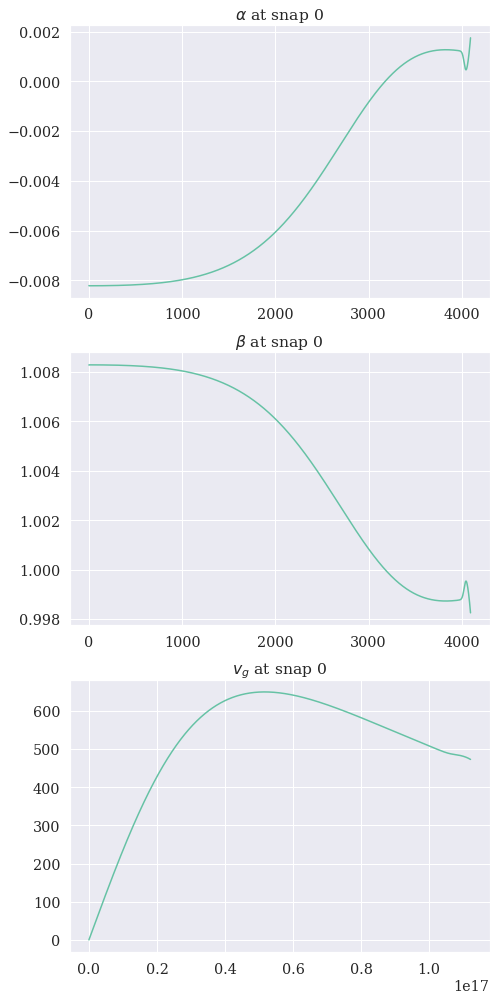

In [86]:
snapid = 0

plt.figure(figsize = (7,14))
plt.subplot(311)
plt.plot(alpha[:, snapid])
plt.title(r'$\alpha$ at snap %i'%(snapid))

plt.subplot(312)
plt.plot(beta[:, snapid])
plt.title(r'$\beta$ at snap %i'%(snapid))

plt.subplot(313)
plt.plot(rc[:, snapid],np.abs(vg[:,snapid]))
plt.title(r'$v_g$ at snap %i'%(snapid))


plt.tight_layout()
plt.show()

In [13]:
class Particles_Corrected(Particles):
    """
    This here needs a new KDK that uses beta to correct the radius of the partilces radius in our interpolation functions, eg. if r_correct is found then we use self.r = self.r + dt*g(r_correct)
    TODO: ADD beta as a parameter for DataSphere as it only depends on the enviorment.
    TODO: IMPLEMENT and TEST inheritance from PARTICLES
    TODO: ADD KDK_drag_Corrected that uses the interpolation method that shows alpha and beta to calulate the corrected value.
    TODO: TEST that it works 

    TODO: Implement Grain distributed constructor for this class
    """
    def __init__(self, n, env, R, Stmin, Stmax,rho_d = 1.6, C = 0.004):
        super().__init__(n, env, R, Stmin, Stmax,rho_d, C)


    def r_trans_b(self):
        """
        b-based rtrans where f = (b-p)/(b-a)
        TODO NOTE proerbly use this as we should have any particles over sphere.rc[-1]
                  but we do have particles that will get smaller that sphere.rc[0]
        """
        idx = self.search
        rp  = magnitude(self.r)

        idx[rp < self.env.rc[idx]] -= 1

        Dt   = self.t[:,0] - self.env.t[self.env.idstep]
        Dr   = self.env.rc[1:] - self.env.rc[:-1]
        Dvg  = self.env._vg[1:, self.env.idstep] - self.env._vg[:-1, self.env.idstep]

        beta = 1/(1 + Dvg[idx]*Dt/Dr[idx])##
        
        rb  = self.env.rc[idx+1]
        vgb = self.env._vg[idx+1, self.env.idstep]

        res      = np.zeros_like(self.r)
        res[:,0] = beta * rp + (1 - beta)*rb - beta* Dt * vgb
        return res


    def r_trans(self):
        """
        a-based rtrans where f = (p-a)/(b-a)
        """
        idx = self.search
        rp  = magnitude(self.r)
    # if p < q
        idx[rp < self.env.rc[idx]] -= 1

        Dt   = self.t[:,0] - self.env.t[self.env.idstep] # TODO assign this as a self. attribute
        Dr   = self.env.rc[1:] - self.env.rc[:-1] #TODO as above
        Dvg  = self.env._vg[1:,self.env.idstep] - self.env._vg[:-1,self.env.idstep]
        beta = 1/(1+Dvg[idx]*Dt/Dr[idx]) 

        ra   = self.env.rc[idx]
        vga  = self.env._vg[idx, self.env.idstep]
        
        res      = np.zeros_like(self.r)
        res[:,0] = beta*rp + (1-beta)*ra - Dt * beta * vga   #temp hack, needs to be this but needs a r/|r| so it scales correctly.
        return res
        

    def KDK_drag_Corrected(self,same_dt=True):
        rtrans = self.r_trans()
        self.kick(0.5) # Update vel for grav
        r      = rtrans  + 0.5 * self.dt* self.v # <----
        Cdt    = 0.5*self.dt * self.env.drag(r,self.s,self.rho_d) 
        self.v = self.v  - Cdt*(self.v - self.env.vg(r))/(1 + Cdt) 
        self.drift(1.0)
        self.kick(0.5)
        rtrans = self.r_trans() # this may be neeeded
        Cdt    = 0.5*self.dt * self.env.drag(rtrans,self.s)
        self.v = self.v  - Cdt*(self.v - self.env.vg(rtrans))/(1 + Cdt) 


    def courant_(self, Cdr = 0.2, Cff = 0.1, Csnap = 0.1, Ckep = 0.1, same_dt = False):
        """
        Courant based on using the translatered radius to calulate dt.
        Seems to work better as it may more correclt correspond to where we actually pull our data.
        kinda like when we evolve.
        """
        r    = self.r_trans()
        dr   = self.env.dr[self.search,None]
        rm   = magnitude(r, True)
        a    = self.gravity() - self.env.drag(r,self.s,self.rho_d)*(self.v - self.env.vg(r))# NOTE   g - c_d(vd - vg)#

        dt_dr   = Cdr   * np.sqrt(2*dr/magnitude(a,True))                       # NOTE a is the total acceleration ie dv/dt that is solve for velocity
        dt_ff   = Cff   * np.sqrt(3*np.pi/(32*self.units.G*self.env.rho(rm)))   # free fall time.
        dt_snap = Csnap * self.env.dtsnap                                       # Snapshot based 
        dt_kep  = Ckep  * np.sqrt(rm*rm*rm/(self.units.G*self.env.M(rm)))       # kepler based
        dt1     = np.minimum(dt_dr, dt_ff) 
        dt2     = np.minimum(dt_snap,dt_kep)
        self.dt =  np.minimum(dt1, dt2)
        if same_dt:
            self.dt[:] = self.dt.min()


In [14]:
def grain_dist_radius_Correction(sphere:DataSphere, func_dist, grain_interface,D = 0.01,debug = False, **kwards):
    """
    All starts along the positive x directions
    
    dust velocity is currently always 0 so same as gas to start.
    
    
    TODO This could be inplemented into the original such that we give the corrected class as an argument.


    args::
        sphere          : DataSphere
        -- The sphere which contrains interpolated data from a collapse
        func_dist       : callable
        -- Solution to the integral g(a1,a2) =  int_a1^a2 dn/dlna a^2 da
           used in fraction fj = g(a_l,a_u)/g(a_min,a_amx)
        grain_interface : 1D ndarray 
        -- array of the interfaces between grain bins 
        D               : float
        -- The dust-to-gas ratio, default = 1/100
           This defualt will give truncation error as 1/100 in binary is an infinite series.
    kwards::
        rho_d : float
        -- material density of the dust, default = 1.6 g/cm^3
        C     : float
        -- Courant number, default = 0.004
    
    return: Particles Class
    -- The paricles class with grains created from a distribution
       The data is structure so [{a[:],radial bin 0},{a[:],radial bin 1},{a[:],radial bin 2},...] ie grains in radial bin 0 first then all grains in radial bin 2 etc.

    TODO BUG there seems to be a bug in placement of particles at the lower end, there are decimal diffrence 
    """
    Ngrain    = len(grain_interface) - 1 # number of grain bins not interfaces
    Nbins     = sphere.ncells - 1 # due to the mass stensil.
    ae        = grain_interface
    ac        = 0.5 * ae[1:] + 0.5 * ae[:-1]
    M         = sphere.M(sphere.rc)
    ## TODO sphere._vg[:,1] = (sphere._rc[:,2]-sphere._rc[:,1])/sphere.dt[1] APPLY THIS TO THE SPHERE GAS!
    fi             = func_dist(ae[:-1], ae[1:])/func_dist(ae[0], ae[-1])
    mi             = M[1:] - M[:-1]
    massdist       = mi[:,None] * fi[None,:] * D
    listsize       = len(fi) * len(mi)
    massdist.shape = listsize
    r              = np.repeat(sphere.rc[:-1], Ngrain)
    s              = np.tile(ac, Nbins)

    particles        = Particles_Corrected(listsize, sphere, 0 ,1, 2,**kwards)
    particles.r[:,0] = r
    particles.v[:,:] = 0
    particles.s[:,0] = s
    particles.M      = massdist
    particles.D      = D
    particles.ngrains = Ngrain
    particles.sinterface = ae
    if debug:
       return particles, mi, fi
    return particles

In [15]:
def dust_to_gas_ParticlesClass(p: DataParticles):
    """
    Returns the dust to gast ratio of the smallest particle.
    NOTE changes idstep

    input : (Union[Particles, DataParticles], int)
    -- Class of dataparticles or particles initialized with an envirment ; what snap id we should check
    TODO, remove snapid as an argument, then it worlds on other env end datasphere, given it has radial bins.

    return : (ndarray, ndarray, ndarray, ndarray)
    -- (dust to gas ratio, number of particles in bins, what bins where each particle is located, mask for smallest grain bin)
        Dust to gas format is D = [M_bin0, M_bin1, M_bin2...M_binM]
    """
    suniq  = np.unique(p.s)
    s_low  = (p.s == suniq.min())
    bins   = p.search[s_low[:,0]]
    Mg     = p.env._M
    dm_g   = Mg[1:] - Mg[:-1]
    dm_g   = dm_g
    print(s_low.shape, p.M.shape)
    m_dust_bin = [np.sum(p.M[s_low[:,0]][bins == i]) for i in bins]
    N          = [np.sum(bins == i) for i in bins]
    binsrange  = np.arange(len(N))

    #if debug:
        #return 
    return m_dust_bin/dm_g[binsrange], N, bins, smask, m_dust_bin, dm_g

np.add.at(a, [0, 1, 2, 2], 1) ## TODO NOTE FROM TROELS CAN MAYBE USED FOR OPTMISING THE "GRAIN SPLITIING" !!

In [16]:
def dust_to_gas_ParticlesClass(p: DataParticles,size : float):
    """
    Returns the dust to gast ratio of the smallest particle.
    NOTE changes idstep

    input : (Union[Particles, DataParticles], int)
    -- Class of dataparticles or particles initialized with an envirment ; what snap id we should check
    TODO, remove snapid as an argument, then it worlds on other env end datasphere, given it has radial bins.

    return : (ndarray, ndarray, ndarray, ndarray)
    -- (dust to gas ratio, number of particles in bins, what bins where each particle is located, mask for smallest grain bin)
        Dust to gas format is D = [M_bin0, M_bin1, M_bin2...M_binM]
    """
    s_low  = (p.s == size)[:,0]
    bins   = p.search[s_low]
    Mg     = p.env._M[:,p.env.idstep]
    dm_g   = Mg[1:] - Mg[:-1]
    
    #m_dust_bin = [np.sum(p.M[s_low][bins == i]) for i in bins] #
    m_dust_bin = np.zeros_like(dm_g)
    for pm, r, sbin in zip(p.M[s_low], magnitude(p.r)[s_low], bins):
        if r <= p.env.rc[sbin]:
            if sbin == 0:
                m_dust_bin[sbin] = m_dust_bin[sbin] + pm
            else:
                dr = p.env.rc[sbin]-p.env.rc[sbin-1] #center to center
                f  = ( p.env.rc[sbin] - r )/dr
                m_dust_bin[sbin]     = m_dust_bin[sbin] + (1-f)*pm
                m_dust_bin[sbin - 1] = m_dust_bin[sbin - 1] + f*pm
        else:
            if sbin == p.env.nsteps - 1:
                m_dust_bin[sbin] = m_dust_bin[sbin] + pm
            else:
                dr = p.env.rc[sbin + 1]-p.env.rc[sbin] #center to center
                f  = ( r - p.env.rc[sbin] )/dr
                m_dust_bin[sbin]     = m_dust_bin[sbin] + (1-f)*pm
                m_dust_bin[sbin + 1] = m_dust_bin[sbin + 1] + f*pm

    N          = [np.sum(bins == i) for i in bins]
    binsrange  = np.arange(len(N))

    #if debug:
        #return 
    return m_dust_bin/dm_g[binsrange], N, bins, s_low, m_dust_bin, dm_g

In [ ]:
self, loadpath, env, skiprows = 0, max_rows = None

In [28]:
# GOTO
sphere = DataSphere('./run_extracted/run067/',sc.CGS)
p      = DataParticles('./SimData/RunTest',sphere, 0,101)

KeyboardInterrupt: 

In [25]:
P      = Particles(1, sphere, 1,1,1)
P.m    = p.M[100]
P.dt   = p.dt[100]
P.t    = p.t[100]
P.s    = p.s[100]
P.r    = np.zeros(len(p.r[100]),2)
P.r[:,0] = p.r[100]

IndexError: index 100 is out of bounds for axis 0 with size 100

In [27]:
dust_to_gas_ParticlesClass(P, P.s.min())

IndexError: index 100 is out of bounds for axis 0 with size 100

In [ ]:
def dust_to_gas_ParticlesClass(p: DataParticles,size : float):
    """
    Returns the dust to gast ratio of the smallest particle.
    NOTE changes idstep

    input : (Union[Particles, DataParticles], int)
    -- Class of dataparticles or particles initialized with an envirment ; what snap id we should check
    TODO, remove snapid as an argument, then it worlds on other env end datasphere, given it has radial bins.

    return : (ndarray, ndarray, ndarray, ndarray)
    -- (dust to gas ratio, number of particles in bins, what bins where each particle is located, mask for smallest grain bin)
        Dust to gas format is D = [M_bin0, M_bin1, M_bin2...M_binM]
    """
    s_low  = (p.s == size)[:,0]
    bins   = p.search[s_low]
    Mg     = p.env._M[:,p.env.idstep]
    dm_g   = Mg[1:] - Mg[:-1]
    
    #m_dust_bin = [np.sum(p.M[s_low][bins == i]) for i in bins] #
    m_dust_bin = np.zeros_like(dm_g)
    for pm, r, sbin in zip(p.M[s_low], magnitude(p.r)[s_low], bins):
        if r <= p.env.rc[sbin]:
            if sbin == 0:
                m_dust_bin[sbin] = m_dust_bin[sbin] + pm
            else:
                dr = p.env.rc[sbin]-p.env.rc[sbin-1] #center to center
                f  = ( p.env.rc[sbin] - r )/dr
                m_dust_bin[sbin]     = m_dust_bin[sbin] + (1-f)*pm
                m_dust_bin[sbin - 1] = m_dust_bin[sbin - 1] + f*pm
        else:
            if sbin == p.env.nsteps - 1:
                m_dust_bin[sbin] = m_dust_bin[sbin] + pm
            else:
                dr = p.env.rc[sbin + 1]-p.env.rc[sbin] #center to center
                f  = ( r - p.env.rc[sbin] )/dr
                m_dust_bin[sbin]     = m_dust_bin[sbin] + (1-f)*pm
                m_dust_bin[sbin + 1] = m_dust_bin[sbin + 1] + f*pm

    N          = [np.sum(bins == i) for i in bins]
    binsrange  = np.arange(len(N))

    #if debug:
        #return 
    return m_dust_bin/dm_g[binsrange], N, bins, s_low, m_dust_bin, dm_g

In [23]:
p.M[0]

array([3.95439752e+15, 5.35376460e+15, 7.24833437e+15, ...,
       2.86754610e+27, 3.88230237e+27, 5.25615670e+27])

In [18]:
def main():
    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)
    sphere     = DataSphere('./run_extracted/run067/',sc.CGS) 
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()    
    sphere.idstep = 0
    p,mi,fj = grain_dist_radius_Correction(sphere, g, ginterface,debug = True)
    M = sphere.M(sphere.rc)
    m = p.M
    check = (np.sum(m))/(M[-1])/p.D
    print("Stepid = %i" %(sphere.idstep))
    print("Mass control check: Sum(M_p)/(M_N*D %.15e" %(check))
    print("Number of particles: %i" %(p.n))
    print("max,min St: %.2e , %.2e" %(p.St.max(),p.St.min()))
    print("max,min St_bigs: %.2e , %.2e" %(p.St[p.s == p.s.max()].max(),p.St[p.s == p.s.max()].min()))
    print("max,min St_small: %.2e , %.2e" %(p.St[p.s == p.s.min()].max(),p.St[p.s == p.s.min()].min()))

if __name__ == '__main__':
    main()

KeyboardInterrupt: 

In [ ]:
try : os.mkdir(path)
except FileExistsError :
    raise('Folder exist, So you might rewrite data')

In [ ]:
def main():
    folder  = "Fullrun1"
    path    = ".\SimData\\" + folder
    try : os.mkdir(path)
    except FileExistsError :
        pass#raise('Folder exist, So you might rewrite data')
    fdt     = open(path + '\\dt.txt','a')
    fmass   = open(path + '\\mass.txt','a')
    fradius = open(path + '\\radius.txt','a')
    fs      = open(path + '\\s.txt','a')
    ftime   = open(path + '\\time.txt','a')
    fvel    = open(path + '\\vel.txt','a')

    sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  
    
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()

    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)

    R       = sphere.rc[-1]
    runtime = sphere.t[-1]
    print('runtime:  t_{collapse} =  %i yr'% (runtime/sphere.units.yr))
    p,_,_ = grain_dist_radius_Correction(sphere, g, ginterface,debug = True)
    St     = (p.St)#.astype(str)
    np.savetxt(fdt    , p.dt.T        , newline=' '); fdt.write('\n')
    np.savetxt(fmass  , p.M           , newline=' '); fmass.write('\n')
    np.savetxt(fradius, magnitude(p.r), newline=' '); fradius.write('\n')
    np.savetxt(fs     , p.s           , newline=' '); fs.write('\n')
    np.savetxt(ftime  , p.t           , newline=' '); ftime.write('\n')
    np.savetxt(fvel   , magnitude(p.v), newline=' '); fvel.write('\n')
    for idt, dtstep in enumerate(p.env.dt[:-1],1):
        k = 0
        while np.any(p.t < p.env.t[idt]):
            p.courant_()
            p.dt      = np.minimum(p.env.t[idt] - p.t, p.dt)
            p.dt[p.t >= p.env.t[idt]] = 0
            p.t = p.t + p.dt
            p.KDK_drag_Corrected()
            k = k + 1
            if k == 1000000:
                print('Max iter it, returning')
                return

            if k % 100 == 0:
                print('snap:', idt,'k: ', k, " min dt: ", np.min(p.dt[p.dt !=0])/p.units.yr,', min missing time:', (p.env.t[idt]-np.min(p.t))/p.units.yr)
        p.env.next #NOTE det skal være uden for p.t comparision   
        if idt % 1 == 0:
            print('snap: %i done \t iterations here: %i'%(idt, k)) 
            np.savetxt(fdt    , p.dt.T        , newline=' '); fdt.write('\n')
            np.savetxt(fmass  , p.M           , newline=' '); fmass.write('\n')
            np.savetxt(fradius, magnitude(p.r), newline=' '); fradius.write('\n')
            np.savetxt(fs     , p.s           , newline=' '); fs.write('\n')
            np.savetxt(ftime  , p.t           , newline=' '); ftime.write('\n')
            np.savetxt(fvel   , magnitude(p.v), newline=' '); fvel.write('\n')
        #if idt % 50 == 0:
        #    break
    fdt.close()    
    fmass.close()  
    fradius.close()
    fs.close()     
    ftime.close()  
    fvel.close()   
    print('Done at t = %.2f yr'%(np.mean(p.t)/p.units.yr))
    return p
if __name__ == '__main__':
   ptest = main()

In [18]:
def St(self: DataParticles, size,snapid,rho_d = 1.6):
    smask = (self.s[snapid] == size)
    #print(smask.shape)
    #print(self.s.shape, self.s[snapid,smask].shape)

    s     = self.s[snapid,smask]
    rm    = self.r[snapid,smask]
    r     = rm[:, None]
    ts    = 1/self.env.drag(r,s[:,None],rho_d)
    tff   = np.sqrt(3*np.pi/(32*self.units.G*self.env.rho(rm))) 

    return ts/tff[:,None]

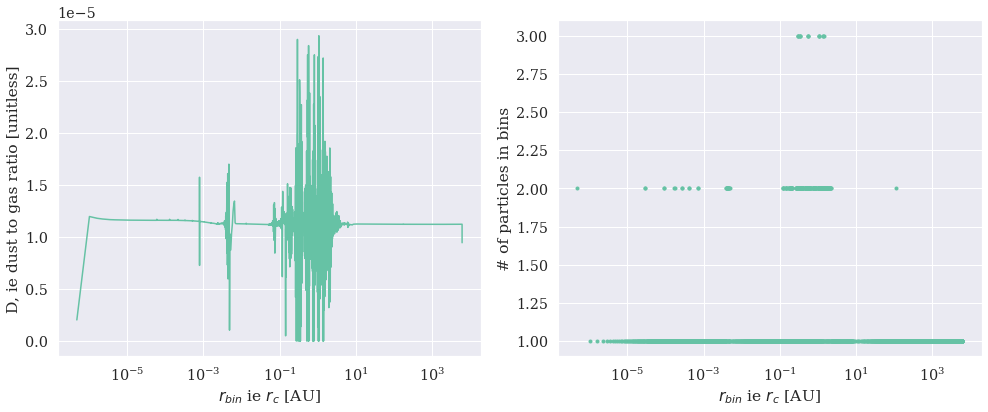

In [26]:

d_t_g, count, bins, smask, grain_mass, dm = dust_to_gas_ParticlesClass(ptest, np.unique(ptest.s).min())
binsrange  = np.arange(len(count))
rc = ptest.env.rc[binsrange]
plt.figure(figsize = (14,6))
plt.subplot(121)
plt.plot(rc/ptest.units.AU,d_t_g,'-')
plt.ylabel(r'D, ie dust to gas ratio [unitless]')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')

plt.xscale('log')
#plt.yscale('log')
ax = plt.subplot(122)
plt.plot(rc/ptest.units.AU,count,'.')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')
plt.ylabel(r'# of particles in bins')
plt.xscale('log')
plt.tight_layout()
plt.show()

In [107]:
rc

array([7.51577138e+11, 1.61267863e+12, 2.57652319e+12, ...,
       9.70713844e+16, 9.71941840e+16, 9.73171338e+16])

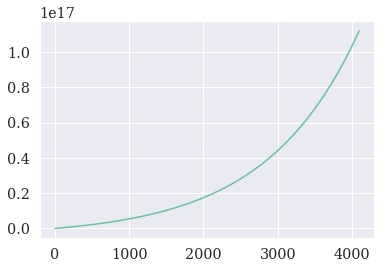

In [109]:
plt.plot(magnitude(p.r[smask]))

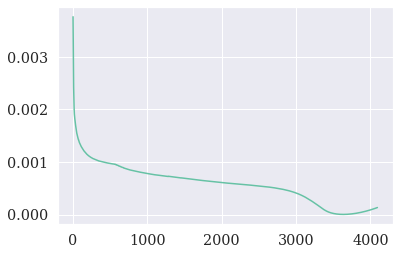

In [65]:
plt.plot(np.abs(magnitude(ptest.r[smask]) - ptest.env.rc[:-1])/ptest.env.rc[:-1])

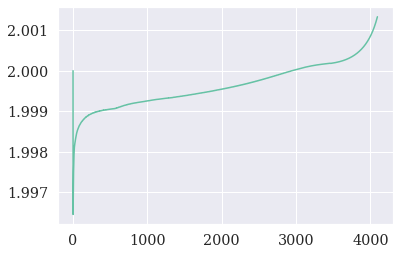

In [74]:
plt.plot(np.abs(magnitude(ptest.v[smask]) - ptest.env._vg[:-1,ptest.env.idstep-1])/np.abs(ptest.env._vg[:-1,ptest.env.idstep-1]))

In [25]:
path = './Plots/Corrected50run/Dust_To_Gas/'
sunique = np.unique(dp.s[1])
# ---------------#
snapid = 0
# -------------- #

try: os.mkdir(path+'snapid_%i/'%(snapid))
except FileExistsError: pass

for idx,s in enumerate(sunique):

    d_t_g, count, bins, smask, grain_mass, dm = dust_to_gas(dp, s, snapid)
    binsrange  = np.arange(len(count))
    rc = dp.env._rc[binsrange,snapid]
    fig = plt.figure(figsize = (14,6))
    ax = plt.subplot(111)
    plt.plot(rc/dp.units.AU,d_t_g,'.')
    plt.title (r'Dust to gas for s=%.2e cm snap = %i'%(s, snapid))
    plt.ylabel(r'D, ie dust to gas ratio [unitless]')
    plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')
    plt.xscale('log')
    plt.yscale('log')
    fig.savefig(path+'snapid_%i/'%(snapid)+'%i; s=%.2e cm snap = %i.png'%(idx, s, snapid))
plt.close('all')

In [26]:
path = './Plots/Corrected50run/Stokesnumber/'
sunique = np.unique(dp.s[1])
# ---------------#
snapid = 35
# St(self,rm,s,rho_d = 1.6):
# -------------- #
try: os.mkdir(path+'snapid_%i/'%(snapid))
except FileExistsError: pass

for idx,s in enumerate(sunique):
    st = St(dp, s, snapid)
    binsrange  = np.arange(len(count))
    rc = dp.env._rc[binsrange,snapid]
    fig = plt.figure(figsize = (14,6))
    #plt.subplot(121)
    plt.plot(rc/dp.units.AU,st,'.')
    plt.title (r'Stokesnumber for s=%.2e cm snap = %i'%(s, snapid))
    plt.ylabel(r'D, ie dust to gas ratio [unitless]')
    plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')

    plt.xscale('log')
    plt.yscale('log')
    fig.savefig(path+'snapid_%i/'%(snapid)+'%i; s=%.2e cm snap = %i.png'%(idx, s, snapid))
plt.close('all')

## Testing why dt becomes smaller when using Particles_Corrected

pr = Particles_grain_radial(sphere_test, g, ginterface)
pc  = grain_dist_radius_Correction(sphere_test, g, ginterface)
for i in range(46):
    print('i = ', i)
    pr.courant() ; pc.courant() 
    pr.t = pr.t + pr.dt ; pc.t = pc.t+ pc.dt 
    dtr = pr.dt         ; dtc = pc.dt
    print("\tt residual:\t",pr.t.max()- pc.t.max())
    print('\tdt residual:\t', ( dtr.min() - dtc.min()))

    pr.dt = np.minimum(pr.env.t[0] - pr.t, pr.dt) ; pc.dt = np.minimum(pc.env.t[0] - pc.t, pc.dt) 
    pr.dt[pr.t >= pr.env.t[0]] = 0                ; pc.dt[pc.t >= pc.env.t[0]] = 0
    print('\tdt modified residual:\t', ( dtr.min() - dtc.min()))


    pr.KDK_drag()
    pc.KDK_drag_Corrected()
   

def main():
    path    = '.\SimData\FileCorrectedTest3'
    fdt     = open(path + '\\dt.txt','a')
    fmass   = open(path + '\\mass.txt','a')
    fradius = open(path + '\\radius.txt','a')
    fs      = open(path + '\\s.txt','a')
    ftime   = open(path + '\\time.txt','a')
    fvel    = open(path + '\\vel.txt','a')

    angles  = np.array([0, 15, 30, 45, 60, 75])
    M, N    = 3,2
    sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  
    
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()

    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)

    R       = sphere.rc[-1]
    runtime = sphere.t[-1]
    print('runtime:  t_{collapse} =  %i yr'% (runtime/sphere.units.yr))
    p,_,_ = Particles_grain_radial(sphere, g, ginterface,debug = True)
    St     = (p.St)#.astype(str)
    np.savetxt(fdt    , p.dt.T        , newline=' '); fdt.write('\n')
    np.savetxt(fmass  , p.M           , newline=' '); fmass.write('\n')
    np.savetxt(fradius, magnitude(p.r), newline=' '); fradius.write('\n')
    np.savetxt(fs     , p.s           , newline=' '); fs.write('\n')
    np.savetxt(ftime  , p.t           , newline=' '); ftime.write('\n')
    np.savetxt(fvel   , magnitude(p.v), newline=' '); fvel.write('\n')

    for idt, dtstep in enumerate(p.env.dt[:-1],1):
        k = 0
        while np.any(p.t < p.env.t[idt]):
            p.courant()
            p.dt      = np.minimum(p.env.t[idt] - p.t, p.dt)
            p.dt[p.t >= p.env.t[idt]] = 0
            p.t = p.t + p.dt
            p.KDK_drag()
            k = k + 1
            if k == 1000000:
                print('Max iter it, returning')
                return

            if k % 100 == 0:
                print('snap:', idt,'k: ', k, " min dt: ", np.min(p.dt[p.dt !=0])/p.units.yr,', min missing time:', (p.env.t[idt]-np.min(p.t))/p.units.yr)
        p.env.next #NOTE det skal være uden for p.t comparision   
        if idt % 1 == 0:
            print('snap: %i done \t iterations here: %i'%(idt, k)) 
            np.savetxt(fdt    , p.dt.T        , newline=' '); fdt.write('\n')
            np.savetxt(fmass  , p.M           , newline=' '); fmass.write('\n')
            np.savetxt(fradius, magnitude(p.r), newline=' '); fradius.write('\n')
            np.savetxt(fs     , p.s           , newline=' '); fs.write('\n')
            np.savetxt(ftime  , p.t           , newline=' '); ftime.write('\n')
            np.savetxt(fvel   , magnitude(p.v), newline=' '); fvel.write('\n')
        if idt % 2 == 0:
            break
    fdt.close()    
    fmass.close()  
    fradius.close()
    fs.close()     
    ftime.close()  
    fvel.close()   
    print('Done at t = %.2f yr'%(np.mean(p.t)/p.units.yr))
    return p
if __name__ == '__main__':
    pwork = main()

pr = Particles_grain_radial(sphere_test, g, ginterface)
pc  = grain_dist_radius_Correction(sphere_test, g, ginterface)
for i in range(46):
    print('i = ', i)
    pr.courant() ; pc.courant() 
    pr.t = pr.t + pr.dt ; pc.t = pc.t+ pc.dt 
    dtr = pr.dt         ; dtc = pc.dt
    print("\tt residual:\t",pr.t.max()- pc.t.max())
    print('\tdt residual:\t', ( dtr.min() - dtc.min()))

    pr.dt = np.minimum(pr.env.t[0] - pr.t, pr.dt) ; pc.dt = np.minimum(pc.env.t[0] - pc.t, pc.dt) 
    pr.dt[pr.t >= pr.env.t[0]] = 0                ; pc.dt[pc.t >= pc.env.t[0]] = 0
    print('\tdt modified residual:\t', ( dtr.min() - dtc.min()))


    pr.KDK_drag()
    pc.KDK_drag_Corrected()
   

In [171]:
def main():
    M, N    = 3,2
    sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  
    
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()

    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)

    R       = sphere.rc[-1]
    runtime = sphere.t[-1]
    print('runtime:  t_{collapse} =  %i yr'% (runtime/sphere.units.yr))
    pr,_,_ = Particles_grain_radial(sphere, g, ginterface,debug = True)
    pc,_,_ = grain_dist_radius_Correction(sphere, g, ginterface,debug = True)


    for idt, dtstep in enumerate(pr.env.dt[:-1],1):
        k = 0

        while np.any(pc.t < pc.env.t[idt]):
            #pr.courant()
            #pr.dt      = np.minimum(pr.env.t[idt] - pr.t, pr.dt)
            #pr.dt[pr.t >= pr.env.t[idt]] = 0
            #pr.t = pr.t + pr.dt
            #pr.KDK_drag()

            pc.courant()
            pc.dt      = np.minimum(pc.env.t[idt] - pc.t, pc.dt)
            pc.dt[pc.t >= pc.env.t[idt]] = 0
            pc.t = pc.t + pc.dt
            pc.KDK_drag_Corrected()
            #print('\tmin t for pr:\t' , pr.t.min()/pc.units.yr)
            #print('\tmin t for pc:\t' , pc.t.min()/pc.units.yr)
            #print('\tmin residual:\t' , (pc.t.min()- pr.t.min())/pc.units.yr)
            #print('\tmin dt for pr:\t', pr.dt[pr.dt !=0].min()/pc.units.yr)
            #print('\tmin dt for pc:\t', pc.dt[pc.dt !=0].min()/pc.units.yr)
            #print('\tmin residual:\t' , (pc.dt[pc.dt !=0].min()- pr.dt[pr.dt !=0].min())/pc.units.yr)
            k += 1
        print('iteration: ',k)
        if idt == 5:
            print('done')
            return


if __name__ == '__main__':
    pcor = main()

runtime:  t_{collapse} =  112817 yr
iteration:  26
iteration:  11
iteration:  8
iteration:  7
iteration:  8
done


In [165]:
def main():
    ## Debug here
    M, N    = 3,2
    sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  
    
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()

    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)

    R       = sphere.rc[-1]
    runtime = sphere.t[-1]
    print('runtime:  t_{collapse} =  %i yr'% (runtime/sphere.units.yr))
    pr,_,_ = Particles_grain_radial(sphere, g, ginterface,debug = True)
    pc,_,_ = grain_dist_radius_Correction(sphere, g, ginterface,debug = True)


    for idt, dtstep in enumerate(pr.env.dt[:-1],1):
        k = 0
        while np.any(pc.t < pc.env.t[idt]):
            pr.courant()
            pr.dt      = np.minimum(pr.env.t[idt] - pr.t, pr.dt)
            pr.dt[pr.t >= pr.env.t[idt]] = 0
            pr.t = pr.t + pr.dt
            pr.KDK_drag()

            pc.courant()
            pc.dt      = np.minimum(pc.env.t[idt] - pc.t, pc.dt)
            pc.dt[pc.t >= pc.env.t[idt]] = 0
            pc.t = pc.t + pc.dt
            pc.KDK_drag_Corrected()
            if k == 9:
                print('iteration: ',k)
                print('\tmin t for pr:\t', pr.t.min()/pc.units.yr)
                print('\tmin t for pc:\t', pc.t.min()/pc.units.yr)
                print('\tmin residual:\t', (pc.t.min()- pr.t.min())/pc.units.yr)
                print('\tmin dt for pr:\t', pr.dt[pr.dt !=0].min()/pc.units.yr)
                print('\tmin dt for pc:\t', pc.dt[pc.dt !=0].min()/pc.units.yr)
                print('\tmin residual:\t', pc.dt[pc.dt !=0].min()- pr.dt[pr.dt !=0].min())
                return pc,pr

            k += 1
            return 


if __name__ == '__main__':
    pc,pr = main()

runtime:  t_{collapse} =  112817 yr
iteration:  9
	min t for pr:	 4074.4181043939234
	min t for pc:	 4074.3844143934016
	min residual:	 -0.03369000052197049
	min dt for pr:	 410.66551072175605
	min dt for pc:	 410.65712331895486
	min residual:	 -264706.4324054718


In [146]:
pc.dt[pc.dt !=0] .min()/pc.units.yr

308.4032709718622

In [147]:
pr.dt[pr.dt !=0] .min()/pr.units.yr

410.66551072175605

In [158]:
idpc = pc.dt[pc.dt !=0] .argmin()
idpr = pr.dt[pr.dt !=0] .argmin()

In [162]:
print(pc.r[idpc,:]," ", pc.s[idpc,:], " ", idpc)
print(pr.r[idpr,:]," ", pr.s[idpc,:], " ", idpr)


[9.21459877e+15 0.00000000e+00]   [2.02446864e-06]   26847
[1.82534178e+16 0.00000000e+00]   [2.02446864e-06]   38987


In [151]:
magnitude(pc.r)

array([2.62383556e+12, 2.62347992e+12, 2.62300112e+12, ...,
       1.11685927e+17, 1.11686250e+17, 1.11686425e+17])

In [154]:
rr = magnitude(pr.r- pc.r)

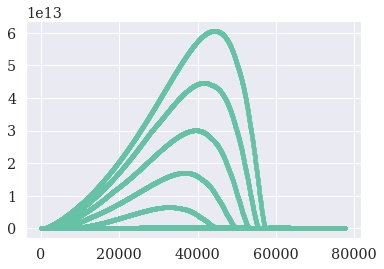

In [156]:
plt.plot(rr,'.')

In [123]:
sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  

sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
sphere.update()


In [124]:
pr,_,_ = Particles_grain_radial(sphere, g, ginterface,debug = True)
pc,_,_ = grain_dist_radius_Correction(sphere, g, ginterface,debug = True)


In [125]:
idt = 0

pr.courant()
pc.courant()
pc.dt       = np.minimum(pr.env.t[idt] - pr.t, pr.dt)
pc.dt[pr.t >= pr.env.t[idt]] = 0

pc.dt       = np.minimum(pc.env.t[idt] - pc.t, pc.dt)
pc.dt[pc.t >= pc.env.t[idt]] = 0

print((pr.dt - pc.dt).min()/pc.units.yr, (pr.dt - pc.dt).max()/pc.units.yr)

pr.KDK_drag()
pc.KDK_drag_Corrected()


15.307194825253505 1072.1021125589546


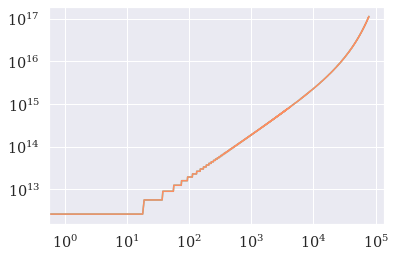

In [118]:
plt.plot(magnitude(pc.r))
plt.plot(magnitude(pr.r))
plt.yscale('log')
plt.xscale('log')


## ------------------------------------------------------------------

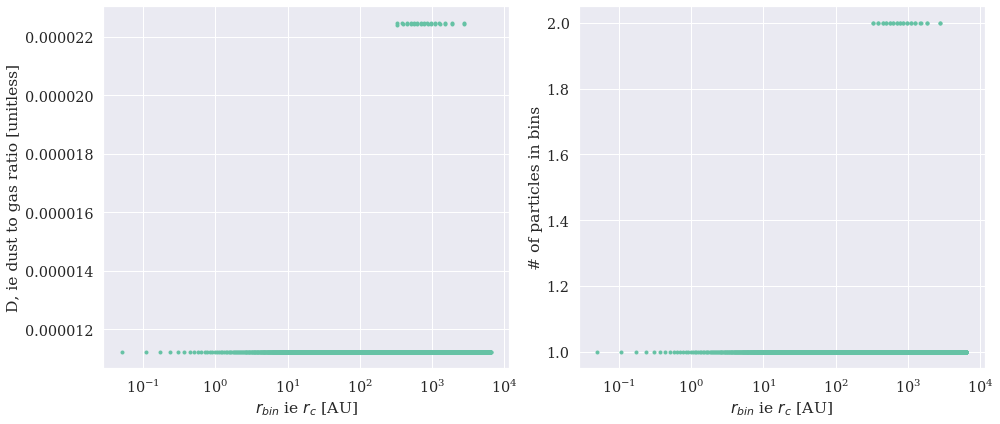

In [147]:
d_t_g, count, bins, smask, grain_mass, dm = dust_to_gas_ParticlesClass(pwork)
binsrange  = np.arange(len(count))
rc = ptest.env.rc[binsrange]
plt.figure(figsize = (14,6))
plt.subplot(121)
plt.plot(rc/ptest.units.AU,d_t_g,'.')
plt.ylabel(r'D, ie dust to gas ratio [unitless]')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')

plt.xscale('log')
#plt.yscale('log')
ax = plt.subplot(122)
plt.plot(rc/ptest.units.AU,count,'.')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')
plt.ylabel(r'# of particles in bins')
plt.xscale('log')
plt.tight_layout()
plt.show()

In [149]:
ptest.dt

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

In [152]:
ptest.t

array([[3.2944122e+12],
       [3.2944122e+12],
       [3.2944122e+12],
       ...,
       [3.2944122e+12],
       [3.2944122e+12],
       [3.2944122e+12]])

In [116]:
m[slow[:,0]]

array([3.95439752e+15, 2.77187598e+16, 7.53520917e+16, ...,
       2.24836765e+25, 2.24935171e+25, 2.25033540e+25])

In [112]:
ptest.St[smask]

array([3.53970723e-05, 3.53970727e-05, 3.53970731e-05, ...,
       1.41103692e-04, 1.41255929e-04, 1.41408415e-04])

In [89]:
print(( ptest.env.rc[1:-1] - ptest.env.rc[:-2] )/ptest.units.AU)

[0.1933839  0.21642744 0.22175727 ... 6.28678436 6.29242517 6.29807562]


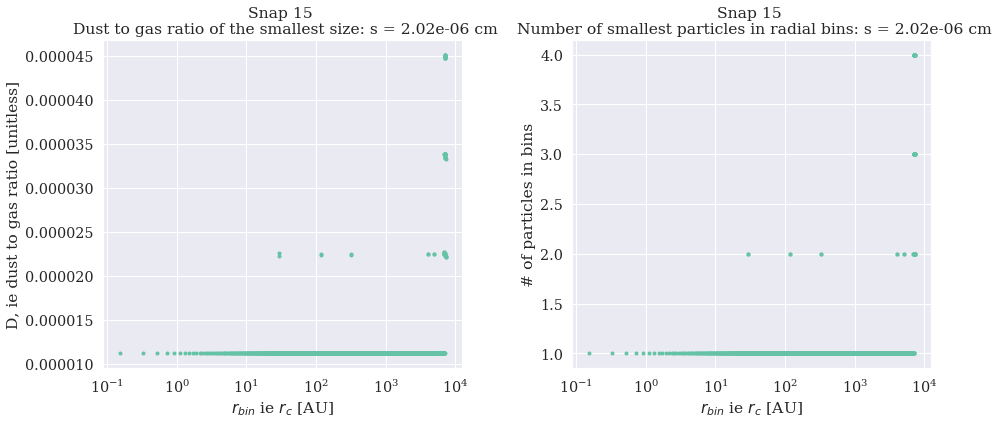

In [41]:
sphere.reset
idx = 15

i   = rowrange[0] + idx  # Snap is index from 1, so when i say index 1 i mean index 0.
sphere.idstep = i
smask = (dp.s[0,:] == dp.s.min())
sbins = dp.search(dp.r[i,smask])  

d_t_g, count, bins, smask, grain_mass, dm = dust_to_gas(dp,i)
dp.env.idstep = i
binsrange  = np.arange(len(count))
rc = dp.env.rc[binsrange]
plt.figure(figsize = (14,6))
plt.subplot(121)
plt.title( 'Snap %i \n Dust to gas ratio of the smallest size: s = %.2e cm'%(i,dp.s[0].min()) )
plt.plot(rc/dp.units.AU,d_t_g,'.')
plt.ylabel(r'D, ie dust to gas ratio [unitless]')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')

plt.xscale('log')
#plt.yscale('log')
ax = plt.subplot(122)
plt.title( 'Snap %i \n Number of smallest particles in radial bins: s = %.2e cm'%(i,dp.s[0].min()) )
plt.plot(rc/dp.units.AU,count,'.')
plt.xlabel(r'$r_{bin}$ ie $r_c$ [AU]')
plt.ylabel(r'# of particles in bins')
plt.xscale('log')
plt.tight_layout()
plt.show()

# Time evolution

In [79]:
def main():
    path    = '.\SimData\FileCorrectedTest3'
    fdt     = open(path + '\\dt.txt','a')
    fmass   = open(path + '\\mass.txt','a')
    fradius = open(path + '\\radius.txt','a')
    fs      = open(path + '\\s.txt','a')
    ftime   = open(path + '\\time.txt','a')
    fvel    = open(path + '\\vel.txt','a')

    angles  = np.array([0, 15, 30, 45, 60, 75])
    M, N    = 3,2
    sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  
    
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()

    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)

    R       = sphere.rc[-1]
    runtime = sphere.t[-1]
    print('runtime:  t_{collapse} =  %i yr'% (runtime/sphere.units.yr))
    p,_,_ = Particles_grain_radial(sphere, g, ginterface,debug = True)
    St     = (p.St)#.astype(str)
    np.savetxt(fdt    , p.dt.T        , newline=' '); fdt.write('\n')
    np.savetxt(fmass  , p.M           , newline=' '); fmass.write('\n')
    np.savetxt(fradius, magnitude(p.r), newline=' '); fradius.write('\n')
    np.savetxt(fs     , p.s           , newline=' '); fs.write('\n')
    np.savetxt(ftime  , p.t           , newline=' '); ftime.write('\n')
    np.savetxt(fvel   , magnitude(p.v), newline=' '); fvel.write('\n')

    for idt, dtstep in enumerate(p.env.dt[:-1],1):
        k = 0
        while np.any(p.t < p.env.t[idt]):
            p.courant()
            p.dt      = np.minimum(p.env.t[idt] - p.t, p.dt)
            p.dt[p.t >= p.env.t[idt]] = 0
            p.t = p.t + p.dt
            p.KDK_drag()
            k = k + 1
            if k == 1000000:
                print('Max iter it, returning')
                return

            if k % 100 == 0:
                print('snap:', idt,'k: ', k, " min dt: ", np.min(p.dt[p.dt !=0])/p.units.yr,', min missing time:', (p.env.t[idt]-np.min(p.t))/p.units.yr)
        p.env.next #NOTE det skal være uden for p.t comparision   
        if idt % 1 == 0:
            print('snap: %i done \t iterations here: %i'%(idt, k)) 
            np.savetxt(fdt    , p.dt.T        , newline=' '); fdt.write('\n')
            np.savetxt(fmass  , p.M           , newline=' '); fmass.write('\n')
            np.savetxt(fradius, magnitude(p.r), newline=' '); fradius.write('\n')
            np.savetxt(fs     , p.s           , newline=' '); fs.write('\n')
            np.savetxt(ftime  , p.t           , newline=' '); ftime.write('\n')
            np.savetxt(fvel   , magnitude(p.v), newline=' '); fvel.write('\n')
        if idt % 2 == 0:
            break
    fdt.close()    
    fmass.close()  
    fradius.close()
    fs.close()     
    ftime.close()  
    fvel.close()   
    print('Done at t = %.2f yr'%(np.mean(p.t)/p.units.yr))
    return p
if __name__ == '__main__':
    pwork = main()

runtime:  t_{collapse} =  112817 yr
snap: 1 done 	 iterations here: 26
snap: 2 done 	 iterations here: 13
Done at t = 15085.55 yr


In [ ]:
x = np.array([1,2,3,4,5])
path    = '.\SimData\File1'
fdt     = open(path + '\\dt.txt','a')
np.savetxt(fdt, p.dt,newline=' ')  
fdt.close()    

## Read Data

In [ ]:
path    = '.\SimData\File3'
dt = np.loadtxt(path + '\\dt.txt')
M  = np.loadtxt(path + '\\mass.txt')
R  = np.loadtxt(path + '\\radius.txt')
S  = np.loadtxt(path + '\\s.txt')
T  = np.loadtxt(path + '\\time.txt')
V  = np.loadtxt(path + '\\vel.txt')

In [79]:

def main():
    idx = 0
    ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)
    sphere     = DataSphere('./run_extracted/run067/',sc.CGS,idstep = idx)
    sphere._vg[:,:-1] = (sphere._rc[:,1:]-sphere._rc[:,:-1])/sphere.dt[None,:-1]
    sphere.update()
    p = Particles_grain_radial(sphere, g, ginterface)


if __name__ == '__main__':
    main()

In [ ]:
R[0].shape
M[0].shape

In [ ]:
plt.plot(R[0]/sc.CGS.AU, M[0],'.')

plt.plot(R[-1]/sc.CGS.AU, M[-1],'.')
plt.show()

In [ ]:
path   = '.\SimData\File4'
sphere = DataSphere('./run_extracted/run067/',sc.CGS)
dp     = DataParticles(path, sphere,max_rows = 10)

In [ ]:
sphere1 = DataSphere('./run_extracted/run067/',sc.CGS)
ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)
p1    = Particles_grain_radial(sphere1, g, ginterface)
suniq = np.unique(p1.s[snapid])
ma    = (p1.s[snapid] == suniq[0])[:,0]
bins  = p1.search[ma]
r     = magnitude(p1.r)[ma]
M     = p1.env._M[:,0]
dm    = M[1:] - M[:-1]
plt.plot(r, p1.M[ma]/dm[bins])

In [109]:
path     = '.\SimData\File4'
sphere   = DataSphere('./run_extracted/run067/',sc.CGS)
rowrange = (0,50)#
dp       = DataParticles(path, sphere,*rowrange)


In [169]:
def drag(p, rm, s,snapid = 0,rho_d = 1.6):
    """
    This is actually the inverse stopping time.
    so drag = 1/t_s
    rho_d = 1.6 g/cm^3
    """
    rho_g = p.env._rho(rm)
    vth   = np.sqrt(8/np.pi * p.units.k_B*p.env.T(rm)/(p.env.mu*p.env.units.m_p))
    return rho_g*vth/(rho_d*s)

In [86]:
dp.r[0,78]/p.units.AU

0.9329215229820378

In [145]:
dp.r.shape

(50, 77805)

In [164]:
smask = (dp.s[0] == dp.s.min())
dp.env.idstep = 0
pid           = 35
#dp.env.update()
cellid = dp.search(dp.r[:,smask][0,pid])
dr = dp.env._re[cellid+1,:50] - dp.env._re[cellid,:50] 
print(dp.r[:,smask][0,pid]/p.units.AU, dp.env._rc[cellid,0]/p.units.AU,dp.env._re[cellid,0]/dp.units.AU,dp.env._re[cellid+1,0]/dp.units.AU)
print(dp.env._rho[cellid, :50])
dp.St([dp.r[:,smask][0,pid]], dp.s[:,smask][0,pid])

8.473561987618291 8.473561987618291 8.351378232683377 8.593440605029974
[1.91827224e-18 1.96635964e-18 2.01446434e-18 2.06180408e-18
 2.11264906e-18 2.18249897e-18 2.24341925e-18 2.31954944e-18
 2.41532498e-18 2.47240015e-18 2.53684306e-18 2.60981381e-18
 2.69271097e-18 2.78723609e-18 2.89548033e-18 3.02004232e-18
 3.16419157e-18 3.33209812e-18 3.52916128e-18 3.76249274e-18
 4.04163711e-18 4.37968496e-18 4.79503564e-18 5.31429498e-18
 5.88869638e-18 6.52588923e-18 7.23178183e-18 8.01368518e-18
 8.87959713e-18 9.83836429e-18 1.08997694e-17 1.20746251e-17
 1.33749059e-17 1.48138441e-17 1.64060854e-17 1.81678185e-17
 2.01169547e-17 2.22732844e-17 2.46586973e-17 2.72973881e-17
 3.02161062e-17 3.34444048e-17 3.70149523e-17 4.09638569e-17
 4.53310258e-17 5.01605314e-17 5.55011062e-17 6.14065862e-17
 6.79364401e-17 7.51563746e-17]


array([[3.77711244e-05]])

In [180]:
print(1/drag(dp,dp.r[:,smask][0,pid],dp.s[:,smask][0,pid])/p.units.yr,1/drag(dp,dp.r[:,smask][49,pid],dp.s[:,smask][49,pid])/p.units.yr)

1.8153810997468751 1.8153676428795116


In [181]:
print(dp.env.dt[0]/p.units.yr,dp.env.dt[49]/p.units.yr)

10721.021125589545 466.46259121133977


In [158]:
plt.figure()
plt.plot((dp.env._rc[cellid,0:50]-dp.r[:,smask][:,pid])/dr,label = 'rc-')
#plt.plot(dp.r[:,78]/p.units.AU,label = 'p.r')
plt.legend()
plt.tight_layout()
plt.show()

Canvas(toolbar=Toolbar(toolitems=[(&#39;Home&#39;, &#39;Reset original view&#39;, &#39;home&#39;, &#39;home&#39;), (&#39;Back&#39;, &#39;Back to previous …

In [94]:
dp.env._rc[0,78]/p.units.AU

0.019585944546461218

In [63]:
fig = plt.figure(figsize = (14,28))
for i in range(int(rowrange[1]-rowrange[0])):
    snapid        = i
    grainid       = 0
    dp.env.idstep = snapid + rowrange[0]
    s_unique      = np.unique(dp.s[snapid])
    mask          = (dp.s[snapid] == s_unique[grainid])
    r             = dp.r[snapid][mask]
    bins          = dp.search(r)
    M             = dp.env._M[:,snapid]
    dm            = (M[1:] - M[:-1])[bins]
    M_dust        = np.array([np.sum(dp.M[snapid][mask][bins == i]) for i in bins])
    N             = np.array([np.sum(bins == i) for i in bins]
    
    plt.subplot(10,1,i+1)
    
    plt.title('Dust to gas ratio pr bin in Snapshot: %i'%(snapid + rowrange[0]))
    plt.plot(dp.env.rc[bins]/dp.units.AU, M_dust/dm,'.')
    #plt.plot(dp.env.rc[bins]/dp.units.AU, np.zeros_like(dm))
    plt.loglog()
    #plt.subplot(10,2,2*i+2)
    #plt.title('number of particles pr bin in Snapshot: %i'%(snapid + rowrange[0]))

    #plt.plot(dp.env.rc[bins]/dp.units.AU, N,'.')
    #plt.xscale('log')
plt.tight_layout()
fig.savefig('.\Plots\Dust_to_gas\%i-%i_snapshot_log.png'%(rowrange[0],rowrange[1]))

Canvas(toolbar=Toolbar(toolitems=[(&#39;Home&#39;, &#39;Reset original view&#39;, &#39;home&#39;, &#39;home&#39;), (&#39;Back&#39;, &#39;Back to previous …

In [ ]:
fig = plt.figure()
plt.plot(dp.env._rc[:,dp.env.idstep]/dp.units.AU,dp.env._rho[:,dp.env.idstep])
plt.xlabel('radius [AU]')
plt.ylabel('Gas density')
plt.loglog()
fig.savefig('.\Plots\Dust_to_gas\gasreference.png')

fig = plt.figure(figsize = (14,28))
for i in range(int(rowrange[1]-rowrange[0])):
    snapid        = i
    grainid       = 0
    dp.env.idstep = snapid + rowrange[0]
    s_unique      = np.unique(dp.s[snapid])
    mask          = (dp.s[snapid] == suniq[grainid])
    r             = dp.r[snapid][mask]
    bins          = dp.search(r)
    M             = dp.env._M[:,snapid]
    dm            = (M[1:] - M[:-1])[bins]
    N             = np.array([np.sum(bins == i) for i in bins])
    plt.subplot(10,2,i+1)
    plt.title('Snapshot: %i'%(snapid + rowrange[0]))
    plt.plot(dp.env.rc[bins]/dp.units.AU, N,'.')
    plt.ylabel('Number of particles in a bin')
plt.tight_layout()
#fig.savefig('./Dust_to_gas/%i-%i_snapshot.png'%(rowrange[0],rowrange[1]))

In [56]:
%matplotlib widget

In [57]:
sphere = DataSphere('./run_extracted/run067/',sc.CGS)
sphere.idstep = 40
plt.plot(sphere.rc/p.units.AU, sphere.rho(sphere.rc))
plt.loglog()

Canvas(toolbar=Toolbar(toolitems=[(&#39;Home&#39;, &#39;Reset original view&#39;, &#39;home&#39;, &#39;home&#39;), (&#39;Back&#39;, &#39;Back to previous …

[]

# How to check dust to gass ratio

In [ ]:
M = p.env.M(p.env.rc)
dm_bim = M[1:] - M[:-1]
bins = p.search
Md   = np.array([np.sum(p.M[bins == i]) for i in range(p.env.ncells-1)])
plt.plot(Md/dm_bim)
plt.loglog()

In [ ]:
sizemask = (p.s[:,0] == np.min(p.s))

M = p.env.M(p.env.rc)
pm = p.M
dm_bim = M[1:] - M[:-1]
bins = p.search[sizemask]
pM  = pm[sizemask]
Md   = np.array([np.sum(pM[bins == i]) for i in range(p.env.ncells-1)])
plt.plot(Md/dm_bim)

In [ ]:
p.St[sizemask]

In [ ]:
np.max(Md)/np.min(Md)

In [ ]:
bins.shape,pM

In [ ]:
p.M.shape, (p.s == np.min(p.s)).shape

In [ ]:
p.M[p.s[:,0] == np.min(p.s)]

In [ ]:
M = p.env.M(p.env.rc)
m = p.M
check = (np.sum(m))/(M[-1])/p.D
print("Mass control check: Sum(M_p)/(M_N*D %.15e" %(check))
print("Number of particles: %i" %(p.n))

# Bin search by interpolation.

To seach by interpolation is very simple, for we know what rc is pr bin or inverse bin pr rc

So if we plot rc,n. then we get a function that we just interpolate and then give rm to get the bin it belongs(floored). This does need some more testing but it seems to be working.
This saves some memeory but at the cost at some calulations as the interpolation class needs to calulate each time. 

There is also the problem each iteration we need a new iterpolation class. This can be pre calulated and stored but it will take up memeory

In [ ]:
ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)
sphere     = DataSphere('./run_extracted/run067/',sc.CGS)    
p = Particles_grain_radial(sphere, g, ginterface,debug = False)
re = p.env.re

In [ ]:
p.courant()

In [ ]:
plt.plot(re,np.arange(0,len(re)))
plt.loglog()
plt.ylabel('log(n) ie log(#rbins)')
plt.xlabel('log(re)')
plt.show()

### log version (linear)

In [ ]:
re = p.env.re
rm = magnitude(p.r)
logn = np.log(np.arange(0,len(re)))
logre = np.log(re)
logre[0] = np.log(re[0]+ 1e-14)
seachlog = scilate.interp1d(logre[1:],logn[1:],fill_value = (-1,np.log(p.env.ncells-1)), bounds_error = False)

In [ ]:
%%timeit
q = np.exp(seachlog(np.log(rm))).astype(int) #NOTE all

In [ ]:
q = np.exp(seachlog(np.log(rm))).astype(int) #NOTE all
print(q)

## non log version

In [ ]:
n     = range(p.env.ncells)
seach = scilate.interp1d(re,n,fill_value = (0,p.env.ncells-1), bounds_error = False)

In [ ]:
%%timeit
qq = seach(rm).astype(int)

In [ ]:
qq = seach(rm).astype(int)
print(qq)

### check if log seach and seach is the same

In [ ]:
# TODO test more!!
np.all(qq == q)

### Testing the interpolation search

In [ ]:
rand_test = np.random.uniform(re[0], re[-1], 50000)
sample = np.random.randint(0,p.env.ncells, 1000)
bins = seach(rand_test[sample]).astype(int)

In [ ]:
truevect = (re[bins]<rand_test[sample]) &( rand_test[sample] <re[bins+1])
print(np.all(truevect))

In [ ]:
plt.figure(figsize = (14,6))

[plt.plot(y/p.units.AU,x,'.',label = str(x),markersize = 15) for x,y in zip(bins,rand_test[sample])]
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.vlines(re[bins]/p.units.AU,0, 4000)
plt.vlines(re[bins+1]/p.units.AU,0, 4000, color = 'r')

plt.ylabel('bin')
plt.xlabel('radius')
plt.show()

Check smallest dust size, as it is perfectly coupled to the gas and should be const

In [ ]:
p.s

In [ ]:
fig = plt.figure(figsize = (14,6))
plt.plot(p.env.rc[:-1]/p.units.AU,Md_bin/dM_bin)
#plt.yscale('log')
#plt.xscale('log')
plt.title("Max time: %.2e yr, min time: %.2e yr"%(np.max(p.t)/p.units.yr, np.min(p.t)/p.units.yr))
plt.xlabel('rc [AU] in log')
plt.ylabel('dust fraction, in log')
fig.savefig('D_test.png')

In [ ]:
plt.hist(where)

In [ ]:
plt.plot(p1.env.re, np.ones_like(p1.env.re),'.')
plt.loglog()

In [ ]:
plt.plot(p1.env.re[1:]-p1.env.re[:-1])
plt.yscale('log')

In [ ]:
plt.plot(p.env.re)

In [ ]:
re[16233]

# Look up table, hopyfully faster

In [ ]:

plt.plot(np.log(re))
plt.xscale('log')

In [ ]:
sphere  = DataSphere('./run_extracted/run067/',sc.CGS)  
ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)
p1,_,_ = Particles_grain_radial(sphere, g, ginterface,debug = True)

In [ ]:
r = magnitude(p.r)
rc = p1.env.rc
re = p1.env.re
logre = np.log(re)

In [ ]:
np.log(re[1:]/re[:-1])

In [ ]:
np.min(np.log(re[1:]-re[:-1]))

In [ ]:
dlnr = np.min(np.log(re[1:]/re[:-1]))
qq = int(np.max(logre)/dlnr)
print(qq)

In [ ]:
Q = np.arange(0,5,0.5)

In [ ]:
Q[int(4.1/0.5)]

In [ ]:
a = np.arange(0,np.log(re.size),dlnr,dtype=np.int64)

In [ ]:
da, dlnr

In [ ]:
rc[-1]/p.units.AU

In [ ]:
idd = int(np.log(r[-1])/da)

In [ ]:
dlnr,da

In [ ]:
int(np.log(r[-1])/dlnr)

In [ ]:
a

In [ ]:
re[-1]/p.units.AU

In [ ]:
print(r[-1]/p.units.AU)
print(np.max(r)/p.units.AU)

In [ ]:
print(idd)
print(a[idd])
print(re[a[idd]]/p.units.AU, re[a[idd]-1]/p.units.AU)

In [ ]:
a[idd]

In [ ]:
p1.env.re[a[idd]],  r[-1]

In [ ]:
r[0]

In [ ]:
idd = int(np.log(r[0])/dlnr)

In [ ]:
np.min(np.log(re[1:]/re[:-1]))

In [ ]:
np.arange()

In [ ]:
#%%timeit
ginterface = np.geomspace(1.42921456e-06, 1.42921456e-01, 20)
sphere1     = DataSphere('./run_extracted/run067/',sc.CGS)    
p1,_,_ = Particles_grain_radial(sphere1, g, ginterface,debug = True)
re = p1.env.re
r  = magnitude(p1.r,True)
M  = p1.env.M(p1.env.rc)

where  = np.sum(re < r,1) - 1 # NOTE Coslty way of finding which bin we belong to.
Md_bin = np.array([np.sum(p.M[where == i]) for i in range(p1.env.ncells-1)])
dM_bin = M[1:] - M[:-1]

In [ ]:
plt.hist(where)

In [ ]:
plt.plot(Md_bin/dM_bin)

## Attempts at distribution sanity check.

In [ ]:
m = p.M.copy()
s = p.s.copy()
m.shape = (p.env.ncells-1),p.ngrains
s.shape = m.shape

In [ ]:
plt.figure(figsize = (14,6))
[plt.plot(p.env.rc[:-1]/p.units.AU,m[:,i]/np.sum(m), label = 's = %.2e cm'%(s[0,i])) for i in range(m.shape[1])]
plt.ylabel('% mass of total dust mass')
plt.legend(bbox_to_anchor=(1.05, 0.9), loc=2, borderaxespad=0., ncol = 2)
plt.text(p.env.rc[:-1][-1]*1.01/p.units.AU,m[-1,-1]/np.sum(m),'s =%.2e '%(s[0,-1]), fontsize = 13)
plt.xlabel(r'$r_c$ [AU]')
plt.tight_layout()
plt.show()

In [ ]:
sphere     = DataSphere('./run_extracted/run067/',sc.CGS)    


In [ ]:
sphere._vg[:,1] = (sphere._rc[:,2]-sphere._rc[:,1])/sphere.dt[1] ## NOTE IMPORTDANT!! kinda of a midpoint rule to the get the velocity.
dr = sphere._rc[:,2]-(sphere._rc[:,1] + 0.5*(sphere._vg[:,1]+sphere._vg[:,1])*sphere.dt[1])
plt.figure()
plt.plot(sphere._rc[:,2], dr/sphere.dt[1])
plt.show()

In [ ]:
np.abs(sphere._vg[:,0]*sphere.dt[0])

In [ ]:
(p.env.ncells-1),p.ngrains

In [ ]:
fig = plt.figure(figsize = (14,6))
[plt.plot(s[i*2**9,:], m[i*2**9,:]/p.units.m_Sun , label = r'$rc$ = %.2e AU'%(p.env.rc[i*2**9]/p.units.AU)) for i in range(8)]
plt.legend(bbox_to_anchor=(1.05, 0.9), loc=2, borderaxespad=0., ncol = 1)
plt.xlabel(r's ie $s_{center}$ [cm]')
plt.ylabel('Total mass of dust bin')
plt.title('Different sampled radial bins, They follow fj as they should in theory')
plt.xscale('log') # NOTE With this i get the original struture of  fj so it was a question about log
plt.text(s[7*2**9,-1], m[7*2**9,-1]/p.units.m_Sun,r'%.2e'%(p.env.rc[7*2**9]/p.units.AU),fontsize= 14)
plt.tight_layout()
plt.show()
#fig.savefig('./test.png')

In [ ]:
plt.plot(s[::2**9],np.trapz(s[::2**9,:], m[::2**9,:]))

In [ ]:
np.trapz(s[::2**9,:], m[::2**9,:]).shape

In [ ]:
s[::2**9,:].shape

In [ ]:
m.shape

In [ ]:
plt.figure(figsize = (9,6))

plt.plot(p.env.rc[:-1]/p.units.AU, np.sum(m, axis = 1)/np.sum(m))
plt.title('Total mass in bins')
plt.ylabel('% mass of total dust mass')
#plt.legend(bbox_to_anchor=(1.05, 0.9), loc=2, borderaxespad=0., ncol = 2)
plt.xlabel(r'$r_c$ [AU]')
plt.tight_layout()
plt.show()

In [ ]:
x = np.array([1,2,3,4,5,6])
print(x <3)
np.sum(x<3)-1

# Plots total mass pr bin, as it changes over time
## So do plots of both how the total mass in each bin changes but also of the individual grains changes, so if all the large particles stop at the same place etc.
To achive this one can check if r_e < r then find the index and remove 1, this will give the index of the cell ie rc the partile belong to. Once everyone has been locacted/"distributed" we can then sum the masses of all the particles sizes and plot, but we can then also just plot the mass of each size as a function of radius. This will allows us to see if how the mass distrubtion though out the sphere changes and evolves over the time of the collapse.

In [ ]:
# TODO We need to test the dust to gas ratio is correct in all cells. This should be the entire density which us
# np.sum(m[radial_bin])*'volume of bin'. here the volume of the bin is equal to 4/3 pi (r_e,n+1 ^ 3 - r_e,n^3) 
# TODO We need to test the mass distirbution for both the total radial bin mass and the specific grain mass distribution.

# Legacy

In [ ]:
np.argmin(p.env.re < 1*p.units.AU) -1 # NOTE this finds a cell

In [ ]:
p.env.rc[4]/p.units.AU

In [ ]:
p.env.re[4]/p.units.AU, p.env.re[5]/p.units.AU

# Naive
sphere = DataSphere('./run_extracted/run067/',sc.CGS)
M = sphere.M(sphere.rc)
I = len(M)
J = 20
N = I*J
r = np.zeros(N)
v = np.zeros(N)
m = np.zeros(N)
s = np.zeros(N)
ae = np.linspace(1.42921456e-06, 1.42921456e-01, J)
ac = 0.5 * ae[1:] + 0.5 * ae[:-1]
D  = 1/100
mm = []
control = 0
montrol = 0
for j in range(J-1):
    fj = g(ae[j], ae[j+1])/g(ae[0], ae[-1])
    control += fj
    for i in range(I-1):
        idx    = I*j + i
        mi     = M[i+1] - M[i]
        m[idx] = mi * fj
        montrol += m[idx]
print(idx)
print(control)
print(montrol/M[-1])


# vectorized
sphere = DataSphere('./run_extracted/run067/',sc.CGS)

M = sphere.M(sphere.rc)
ae = np.linspace(1.42921456e-06, 1.42921456e-01, 20)
I = len(M)
J = len(ae)
N = I*J
r = np.zeros(N)
v = np.zeros(N)
m = np.zeros(N)
s = np.zeros(N)
ae = np.linspace(1.42921456e-06, 1.42921456e-01, J)
ac = 0.5 * ae[1:] + 0.5 * ae[:-1]
D  = 1/100
mm = []
control = 0
montrol = 0

fi = g(ae[:-1], ae[1:])/g(ae[0], ae[-1])
mi = M[1:] - M[:-1]
res = mi[:,None]*fi[None,:]
res.shape = len(fi)*len(mi)

print(np.sum(res)/M[-1])
print(np.sum(fi))

def BE(units, M_BE = 1.0, T = 10):
    """
    Effectively a constuctor for the class. Most just so we dont have a long __init__, than can take up space
    NOTE units is just sc.CGS look at the actuall scaling
    TODO Calulate rc, rho_c and write then into the BE_sphere
    TODO implement the use of the scale module.
    TODO ! Have the lane-emden be save to a file, then by keyword or another function allow for regeneration of the values
           Also save the crit values and allow the recalulation to find these again. This is not nesseary, but it is just nice to have, such that the file is lost
           it can be regnerated. Recalulation every time is just a waste of time!!!
    """
    # check which M, R , T is none kinda like scaling does input check
    mu = 2.42
    Acrit,xcrit,ycrit,mcrit = np.loadtxt('./emden-solve/crit-value.txt',unpack = True) # Acrit, xcrit, ycrit, mcrit
    xi,yi,_                 = np.loadtxt('./emden-solve/rho-adim.txt'  ,unpack = True)
    M_BE  = M_BE * units.m_Sun
    cs_sq = units.k_B*T/(mu*units.m_p)
    rho_c = mcrit**2 * cs_sq**3/(4*np.pi*ycrit * M_BE**2 * units.G**3)
    r_c   = np.sqrt(cs_sq/(4*np.pi * units.G * rho_c))
    
    sphere       = BE_sphere()
    sphere.units = units
    sphere.y     = scilate.interp1d(xi,yi,'linear')
    sphere.xcrit = xcrit
    sphere.xmin  = xi[0]; sphere.xmax  = xi[-1]
    sphere.rc    = r_c
    sphere.rho_c = rho_c
    sphere.mu    = mu
    return sphere

class BE_sphere(object):
    # xmin, xmax are temp? maybe NOTE
    __slots__ = 'units','rho_c','rc','xcrit','y', 'xmin','xmax','mu','rho','rho_d','T'
               #sc.cgs , float, float, float, callable, float, float
    def __init__(sphere,units, M_BE = 1.0, T = 10,drag=0.001):
        Acrit,xcrit,ycrit,mcrit = np.loadtxt('./emden-solve/crit-value.txt',unpack = True) 
        xi,yi,_                 = np.loadtxt('./emden-solve/rho-adim.txt'  ,unpack = True)
        M_BE  = M_BE * units.m_Sun
        cs_sq = units.k_B*T/(units.mu*units.m_p) # base units
        rho_c = mcrit**2 * cs_sq**3/(4*np.pi*ycrit * M_BE**2 * units.G**3)
        r_c   = np.sqrt(cs_sq/(4*np.pi * units.G * rho_c))

        sphere.T     = T
        sphere.rho_d = 1.6# g/cm^3 # omregne TODO
        sphere.units = units
        sphere.rc    = r_c
        sphere.rho_c = rho_c
        sphere.mu    = units.mu

        sphere.y     = scilate.interp1d(xi,yi,'linear')
        sphere.rho   = scilate.interp1d(xi*r_c,yi*rho_c,'linear')
        sphere.xcrit = xcrit
        sphere.xmin  = xi[0]; sphere.xmax  = xi[-1]

    def drag(self, r, s,rho_d = 1.6,):
        """
        rho_d = 1.6 g/cm^3
        """
        rm    = magnitude(r)
        rho_g = self.rho(rm)
        vth   = np.sqrt(8/np.pi) * self.units.k_B*self.T/(self.mu*self.units.m_p)
        return rho_g*vth/(rho_d*s)
        #vth =  self.units.k_B*self.T/(self.units.mu*self.units.m_p)
 

    def radius_crit(self, N = 1000):
        """
        TODO: when scaling is properbly implemented, remove AU
        """
        x = np.linspace(self.xmin, self.xcrit, N)
        return x*self.rc/self.units.AU

    def mass_total(self, N= 1000):
        """
        asssumes spherical symmetric in solar masses
        TODO: when scaling is properbly implemented, remove m_Sun
        """
        x, dx = np.linspace(self.xmin, self.xcrit, N, retstep = True)
        return 4*np.pi*np.cumsum(x**2*self.y(x))*dx* self.rc**3*self.rho_c/self.units.m_Sun       



class BE_sphere(object):
    # xmin, xmax are temp? maybe NOTE
    __slots__ = 'units','rho_c','rc','xcrit','y', 'xmin','xmax','mu','rho','T','M'
               #sc.cgs , float, float, float, callable, float, float
    def __init__(sphere,units, M_BE = 1.0, T = 10,drag=0.001):
        Acrit,xcrit,ycrit,mcrit = np.loadtxt('./emden-solve/crit-value.txt',unpack = True) 
        xi,yi,_                 = np.loadtxt('./emden-solve/rho-adim.txt'  ,unpack = True)
        dx = xi[1]-xi[0]

        M_BE  = M_BE * units.m_Sun
        cs_sq = units.k_B*T/(units.mu*units.m_p) # base units
        rho_c = mcrit**2 * cs_sq**3/(4*np.pi*ycrit * M_BE**2 * units.G**3)
        r_c   = np.sqrt(cs_sq/(4*np.pi * units.G * rho_c))

        
        sphere.T     = T
        sphere.units = units
        sphere.rc    = r_c
        sphere.rho_c = rho_c
        sphere.mu    = units.mu

        m = 4*np.pi*np.cumsum(xi*xi * yi)*dx*rho_c * r_c**3
        sphere.M     = scilate.interp1d(xi*r_c,m) ##TODO find a way to limit do xcrit?


        sphere.y     = scilate.interp1d(xi,yi,'linear')
        sphere.rho   = scilate.interp1d(xi*r_c,yi*rho_c,'linear')
        sphere.xcrit = xcrit
        sphere.xmin  = xi[0]; sphere.xmax  = xi[-1]

    def drag(self, r, s,rho_d = 1.6,):
        """
        rho_d = 1.6 g/cm^3
        """
        rm    = magnitude(r,True)
        rho_g = self.rho(rm)
        vth   = np.sqrt(8/np.pi * self.units.k_B*self.T/(self.mu*self.units.m_p))
        return rho_g*vth/(rho_d*s)
        #vth =  self.units.k_B*self.T/(self.units.mu*self.units.m_p)



class Particles(object):
    #__slots__ = ''
    # TODO maybe initalize everything as non ambigous vectors
    def __init__(self, n, steps, env, smin, smax,rho_d = 1.6):
        self.n  = n
        self.t  = np.zeros((n,steps))
        self.dt = np.zeros(self.n)
        self.env = env ## enviorment ie sphere.
        self.units = env.units
        self.r = np.zeros((n,2))
        self.v = self.r.copy()
        self.s = np.linspace(smin,smax,n)
        self.steps = steps
        self.rho_d = rho_d # g/cm ^3
        
            
    def courant_g(self,same_dt=True):
        """ Determine time step(s) for at least self.nstep steps per orbit.
            If same_dt is True, take the same time step for all particles,
            If False, take nstep steps per orbit, for all radii
        """
        rm = magnitude(self.r)
        vm = magnitude(self.v)
        gm  = magnitude(self.gravity())
        self.dt = 0.004 * vm/gm
        #if same_dt:
        #    self.dt[:] = self.dt.min()
        #    self.t = self.t + self.dt[0]

    def gravity(self):
        rm = magnitude(self.r)[:,None]
        return  - self.r * self.units.G*self.units.m_Sun/(rm*rm*rm) # TODO add mass change
        #return -self.r*self.G/(rm*rm*rm) # self .G is temp

    def kick(self,step=0.5):
        """grav velocity step"""
        force = self.gravity()#not really a force, more so an acceleration
        self.v = self.v + step*self.dt[:,None]*force
    
    def drift(self,step=1.0):
        """ Spacial step"""
        self.r = self.r + step*self.dt*self.v

    def KDK(self,same_dt=True):
        self.courant()
        self.kick(0.5)
        self.drift(1.0)
        self.kick(0.5)

    def drag_debug(self, r, v):
        """
        returns the "drag velocity change" so \Delta v_{drag}
        NOTE
        Is here for debug reasons. The function call might not be worth it.
        Although it should be minimal.
        TODO
        make this a function, that takes : r,p,v?
        This does that we dont need to load this method as part of teh gas
        """
        Cdt    = self.dt * self.env.drag(r,self.s,self.rho_d) # NOTE changed self.r to r as it should be at time step 0.5
        return Cdt[:,None]*(v - 0)/(1 + Cdt[:,None]) # vg = 0

    def KDK_drag(self,same_dt=True):
        self.courant_g()
        #self.dt = 3.154e+7
        self.kick(0.5)
        # NOTE + != * :(
        r      = self.r  + 0.5 * self.dt * self.v # half here as it needs to sync with kick
        Cdt    = self.dt * self.env.drag(r,self.s,self.rho_d) # NOTE changed self.r to r as it should be at time step 0.5
        self.v = self.v  - Cdt*(self.v - 0)/(1 + Cdt) # vg = 0
        self.drift(1.0)
        self.kick(0.5)
        Cdt    = self.dt * self.env.drag(self.r,self.s)
        self.v = self.v  - Cdt*(self.v - 0)/(1 + Cdt) # vg = 0


def main():
    global p,v_kepler,r
    sphere = BE_sphere(sc.CGS,1,10)

    p = Particles(1,3000,sphere,smin = 1e4, smax = 1e4)

    p.r[:,0] = 0.99*p.env.xcrit*p.env.rc
    p.s[0]   = 1e4
    angle    = 0
    v_Kepler = np.sqrt(p.units.G*p.env.M(magnitude(p.r))/magnitude(p.r))
    p.v[:,0] = -v_Kepler*np.sin(angle)
    p.v[:,1] = +v_Kepler*np.cos(angle)
    rs = magnitude(p.r)

    rv  = np.zeros((p.steps,2))
    tv  = np.zeros((p.steps,1))

    for t in range(p.steps):
        p.KDK_drag()
        rv[t] = p.r
        tv[t] = p.dt


    with plt.style.context('ggplot'):

        fig = plt.figure(figsize = (19,9))

        ax = plt.subplot(131)
        plt.title('s = %.2e cm'%(p.s[0]))
        ax.axis('equal')
        plt.xlim([-p.env.xcrit*p.env.rc/p.units.AU,p.env.xcrit*p.env.rc/p.units.AU])
        plt.ylim([-p.env.xcrit*p.env.rc/p.units.AU,p.env.xcrit*p.env.rc/p.units.AU])
        plt.plot(rv[:,0]/p.units.AU,rv[:,1]/p.units.AU)


        ax = plt.subplot(132)
        plt.plot(np.cumsum(tv), magnitude(rv))
        plt.show()

if __name__ == '__main__':
    main()